# Libraries

In [1]:
require("IRdisplay")
require("ggplot2")
require("GGally")
require("repr")
require("reshape2")
require("dplyr")
require("lsr")
require("MASS")
require("gridExtra")
require("ggfortify")
require("car")
require("foreach")

Loading required package: IRdisplay
Loading required package: ggplot2
Loading required package: GGally
Loading required package: repr
Loading required package: reshape2
Loading required package: dplyr

Attaching package: ‘dplyr’

The following object is masked from ‘package:GGally’:

    nasa

The following objects are masked from ‘package:stats’:

    filter, lag

The following objects are masked from ‘package:base’:

    intersect, setdiff, setequal, union

Loading required package: lsr
Loading required package: MASS

Attaching package: ‘MASS’

The following object is masked from ‘package:dplyr’:

    select

Loading required package: gridExtra

Attaching package: ‘gridExtra’

The following object is masked from ‘package:dplyr’:

    combine

Loading required package: ggfortify
Loading required package: car

Attaching package: ‘car’

The following object is masked from ‘package:dplyr’:

    recode

Loading required package: foreach


# Chapter 2. Statistical Learning

## Applied Exercises

### Exercise 8: The College data set 

The **college** data set contains demographic characteristics, tuition, and more for USA colleges. The data set, which can be found in the file `College.csv`, contains a number of variables for 777 different universities and colleges in the US.

**Variable** | **Description**
:- | :-
**Private** | Public/private indicator
**Apps** | Number of applications received
**Accept** | Number of applicants accepted
**Enroll** | Number of new students enrolled
**Top10perc** | New students from top 10 % of high school class
**Top25perc** | New students from top 25 % of high school class
**F.Undergrad** | Number of full-time undergraduates
**P.Undergrad** | Number of part-time undergraduates
**Outstate** | Out-of-state tuition
**Room.Board** | Room and board costs
**Books** | Estimated book costs
**Personal** | Estimated personal spending
**PhD** | Percent of faculty with Ph.D.’s
**Terminal** | Percent of faculty with terminal degree
**S.F.Ratio** | Student/faculty ratio
**perc.alumni** | Percent of alumni who donate
**Expend** | Instructional expenditure per student
**Grad.Rate** | Graduation rate

In [2]:
college <- read.csv("data/College.csv")
rownames(college) <- college[, 1]
college <- college[, -1]
head(college)

,Private,Apps,Accept,Enroll,Top10perc,Top25perc,F.Undergrad,P.Undergrad,Outstate,Room.Board,Books,Personal,PhD,Terminal,S.F.Ratio,perc.alumni,Expend,Grad.Rate
Abilene Christian University,Yes,1660,1232,721,23,52,2885,537,7440,3300,450,2200,70,78,18.1,12,7041,60
Adelphi University,Yes,2186,1924,512,16,29,2683,1227,12280,6450,750,1500,29,30,12.2,16,10527,56
Adrian College,Yes,1428,1097,336,22,50,1036,99,11250,3750,400,1165,53,66,12.9,30,8735,54
Agnes Scott College,Yes,417,349,137,60,89,510,63,12960,5450,450,875,92,97,7.7,37,19016,59
Alaska Pacific University,Yes,193,146,55,16,44,249,869,7560,4120,800,1500,76,72,11.9,2,10922,15
Albertson College,Yes,587,479,158,38,62,678,41,13500,3335,500,675,67,73,9.4,11,9727,55


#### Exercise 8a 

Use the `summary()` function to produce a numerical summary of the variables in the data set.

**Note:** to fit better in this notebook, I will print summary by groups of columns.

In [3]:
for (i in list(1:6, 7:12, 13:18)) print(summary(college[, i]))

 Private        Apps           Accept          Enroll       Top10perc       Top25perc    
 No :212   Min.   :   81   Min.   :   72   Min.   :  35   Min.   : 1.00   Min.   :  9.0  
 Yes:565   1st Qu.:  776   1st Qu.:  604   1st Qu.: 242   1st Qu.:15.00   1st Qu.: 41.0  
           Median : 1558   Median : 1110   Median : 434   Median :23.00   Median : 54.0  
           Mean   : 3002   Mean   : 2019   Mean   : 780   Mean   :27.56   Mean   : 55.8  
           3rd Qu.: 3624   3rd Qu.: 2424   3rd Qu.: 902   3rd Qu.:35.00   3rd Qu.: 69.0  
           Max.   :48094   Max.   :26330   Max.   :6392   Max.   :96.00   Max.   :100.0  
  F.Undergrad     P.Undergrad         Outstate       Room.Board       Books           Personal   
 Min.   :  139   Min.   :    1.0   Min.   : 2340   Min.   :1780   Min.   :  96.0   Min.   : 250  
 1st Qu.:  992   1st Qu.:   95.0   1st Qu.: 7320   1st Qu.:3597   1st Qu.: 470.0   1st Qu.: 850  
 Median : 1707   Median :  353.0   Median : 9990   Median :4200   Median : 5

There’s way more private universities than public universities.

#### Exercise 8b

Use the `pairs()`  function to produce a scatterplot matrix of the first ten columns or variables of the data.

**Note:** Whenever possible, I will use a package that I think it will be prettier or better.

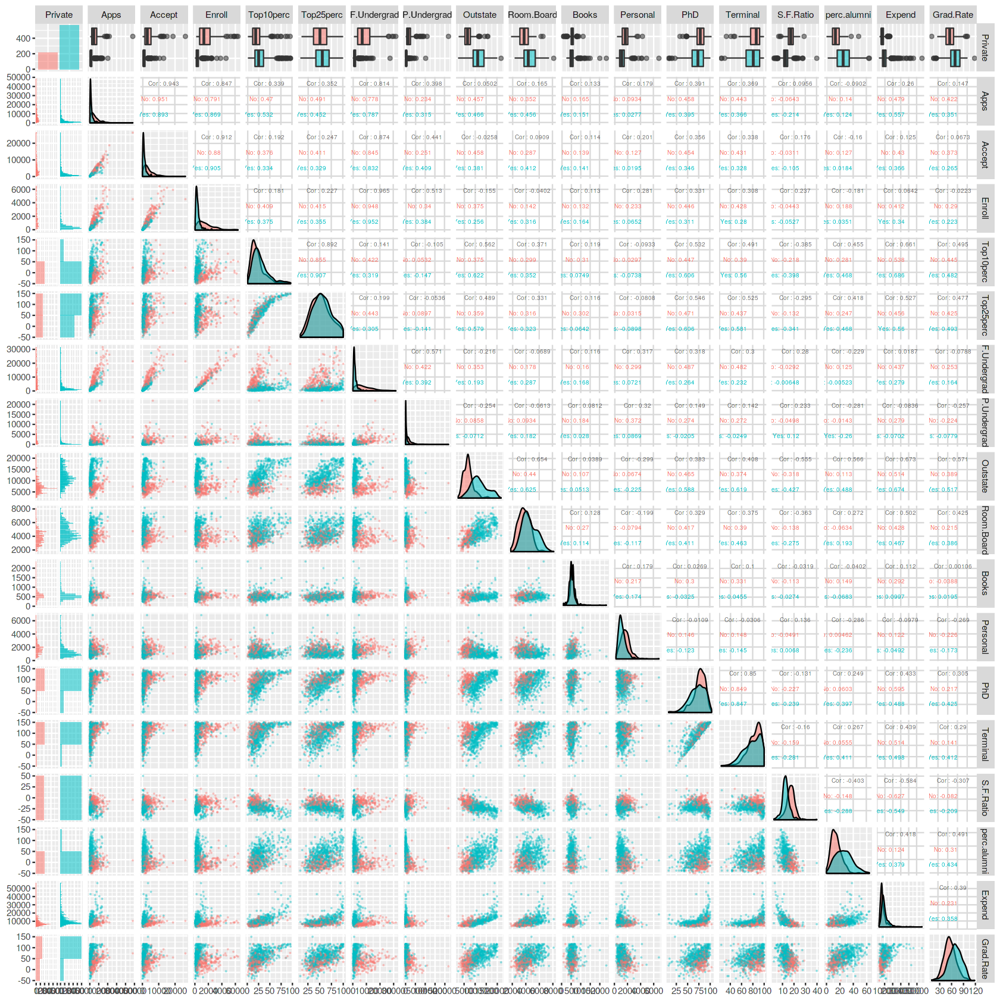

In [4]:
library("ggplot2")
library("GGally")
library("repr")

options(repr.plot.width = 14, repr.plot.height = 14)

ggpairs(
    college, 
    aes(colour = Private, alpha = 0.4), 
    lower = list(
        combo = wrap("facethist", binwidth = 100), 
        continuous = wrap("points", alpha = 0.3, size = 0.1)), 
    upper = list(
        continuous = wrap("cor", size = 2)))

There are more full-time undergraduates in public schools than in private schools. Curiously, the estimate personal spending seems a bit higher for public students.

#### Exercise 8c

Use the `plot()` function to produce side-by-side box plots of **Outstate** versus **Private**.

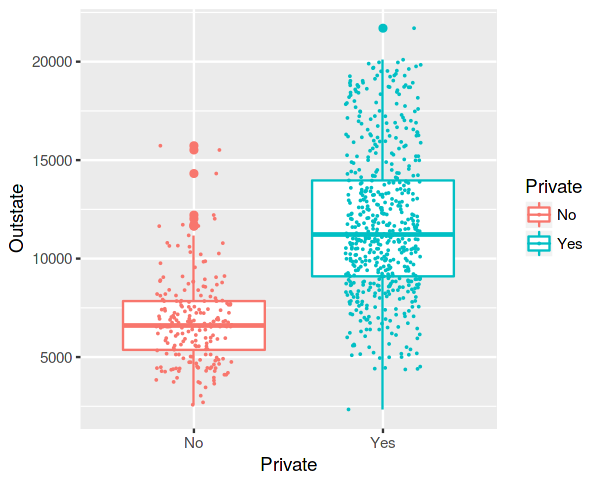

In [5]:
options(repr.plot.width = 5, repr.plot.height = 4)

ggplot(college, aes(Private, Outstate, colour = Private)) +
    geom_boxplot() + 
    geom_jitter(width = 0.2, size = 0.01)

#### Exercise 8d

Create a new qualitative variable, called **Elite**, by binning the **Top10perc** variable. We are going to divide universities into two groups based on whether or not the proportion of students coming from the top 10% of their high school classes exceeds 50%. Use the `summary()` function to see how many elite universities there are.

In [6]:
Elite <- rep("No", nrow(college))
Elite[college$Top10perc >= 50] <- "Yes"
Elite <- as.factor(Elite)
college <- data.frame(college, Elite)
summary(Elite)

No Yes 
694  83

Now use the `plot()` function to produce side-by-side boxplots of **Outstate** versus **Elite**.

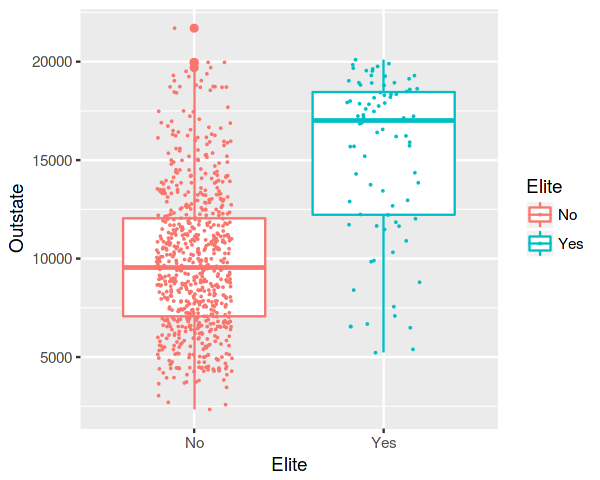

In [7]:
ggplot(college, aes(Elite, Outstate, colour = Elite)) + 
    geom_boxplot() + 
    geom_jitter(width = 0.2, size = 0.01)

#### Exercise 8e

Use the `hist()` function to produce some histograms with differing numbers of bins for a few of the quantitative variables.

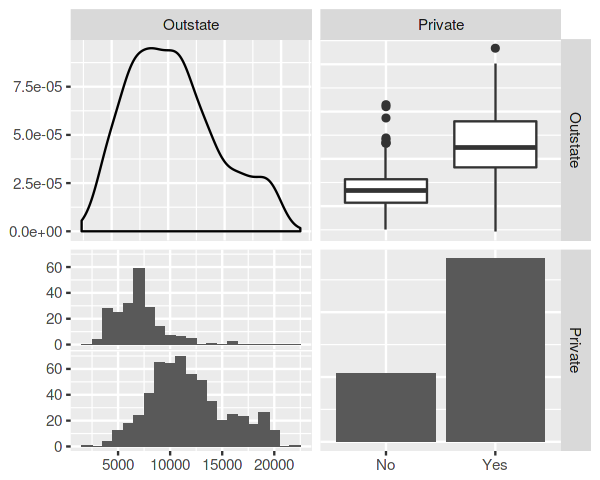

In [8]:
ggpairs(
    college, 
    columns = c("Outstate", "Private"),
    lower = list(
        combo = wrap("facethist", binwidth = 1000)))

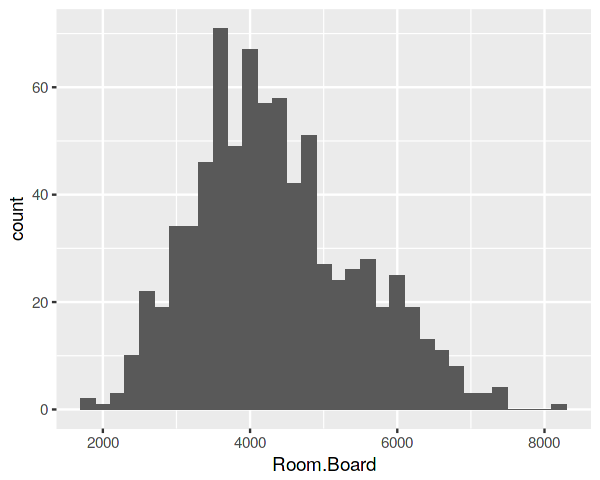

In [9]:
ggplot(college, aes(Room.Board)) + geom_histogram(binwidth = 200)

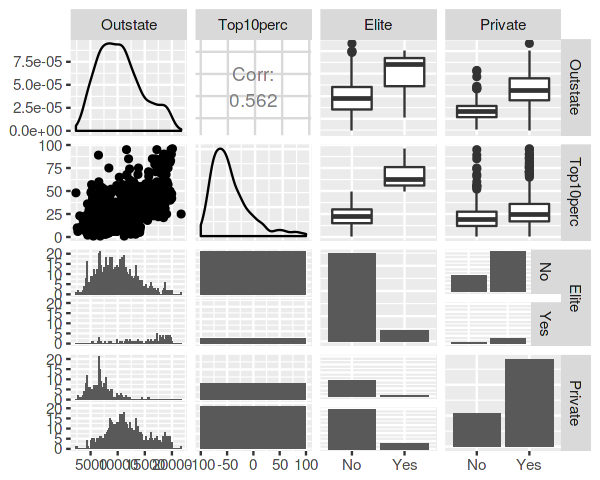

In [10]:
ggpairs(
    college[, c("Outstate", "Top10perc", "Elite", "Private")], 
    lower = list(
        combo = wrap("facethist", binwidth = 200)))

I don’t understand what is a Out-of-state private tuition. Does the value of 
out-of-state tuition actually mean the private tuition cost?

The **Elite** universities have higher out-of-state tuitions, which is expected.

Let’s see the number of applications that were sent, accepted and the final number of new students.

Also, we will compute the percentage of applications that were accepted, and the same for new students enrolled.

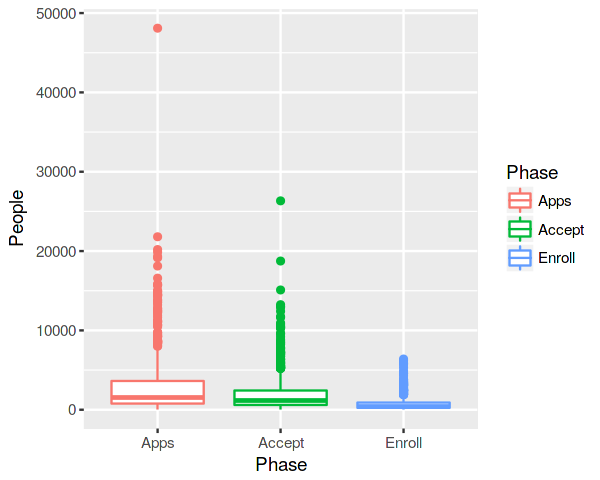

In [11]:
library("reshape2")

college$AcceptPerc <- college$Accept / college$Apps
college$EnrollPerc <- college$Enroll / college$Apps

view <- melt(
    cbind(
        row.names(college), 
        college[, c("Apps", "Accept", "Enroll")]),
    id.vars = 1)
colnames(view) <- c("University", "Phase", "People")

ggplot(view, aes(Phase, People, colour = Phase)) + geom_boxplot() 

There is a single university with almost 50k applications. Let’s see which one it is.array

In [12]:
famous.university <- college[which.max(college$Apps), ]
famous.university

,Private,Apps,Accept,Enroll,Top10perc,Top25perc,F.Undergrad,P.Undergrad,Outstate,Room.Board,⋯,Personal,PhD,Terminal,S.F.Ratio,perc.alumni,Expend,Grad.Rate,Elite,AcceptPerc,EnrollPerc
Rutgers at New Brunswick,No,48094,26330,4520,36,79,21401,3712,7410,4748,⋯,2009,90,95,19.5,19,10474,77,No,0.5474695,0.09398262


It is a public university, with a low **Top10perc**. Let’s draw the boxplots again with horizontal lines marking this specific observation in each boxplot.

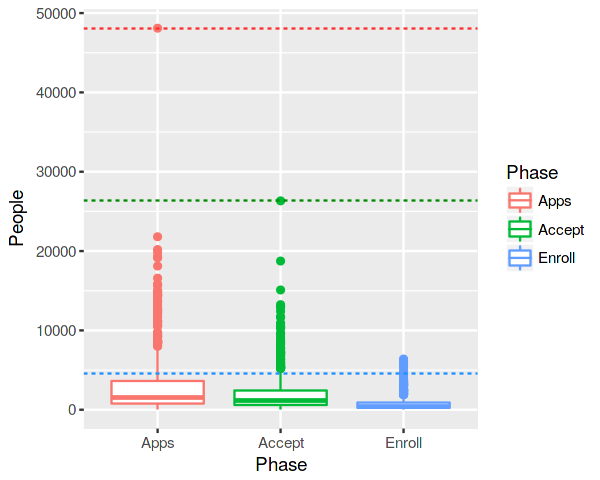

In [13]:
ggplot(view, aes(Phase, People, colour = Phase)) + 
    geom_boxplot() +
    geom_hline(yintercept = famous.university$Apps, 
               linetype = "dashed", color = "firebrick1") +
    geom_hline(yintercept = famous.university$Accept, 
               linetype = "dashed", color = "green4") +
    geom_hline(yintercept = famous.university$Enroll, 
               linetype = "dashed", color = "dodgerblue1")

Let’s plot the percentage of applications that were accepted, and the same for new students enrolled.

We will add the same horizontal lines marking where **Rutgers at New Brunswick** is located.

,AcceptPerc,EnrollPerc
Rutgers at New Brunswick,0.55,0.09


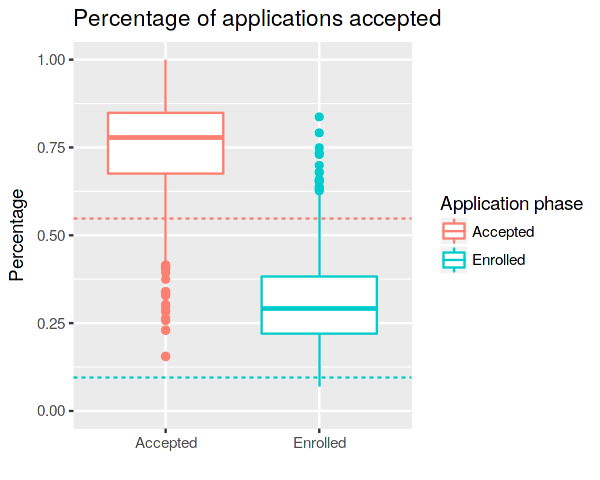

In [14]:
view <- melt(
    cbind(
        row.names(college), 
        college[, c("AcceptPerc", "EnrollPerc")]),
    id.vars = 1)
colnames(view) <- c("University", "Phase", "People")

ggplot(view, aes(Phase, People, colour = Phase)) + 
    geom_boxplot() +
    geom_hline(
        yintercept = famous.university$AcceptPerc, 
        linetype = "dashed", 
        color = "salmon") +
    geom_hline(
        yintercept = famous.university$EnrollPerc, 
        linetype = "dashed", 
        color = "#00cccc") +
    scale_y_continuous(limit = c(0, 1)) +
    scale_x_discrete(labels = c("Accepted", "Enrolled")) +
    scale_colour_manual(
        values = c("salmon", "#00cccc"),
        labels = c("Accepted", "Enrolled")) +
    labs(title = "Percentage of applications accepted",
         x = "", 
         y = "Percentage",
         colour = "Application phase")

round(famous.university[, c("AcceptPerc", "EnrollPerc")], 2)

Out of the almost 49k application **Rutgers at New Brunswick** has received, 50% was accepted, and only 10% of the total students actually enrolled.

### Exercise 9: The Auto data set

The **Auto MPG** data set has gas mileage, horsepower, and other information for cars.

*“The data concerns city-cycle fuel consumption in miles per gallon, to be predicted in terms of 3 multivalued discrete and 5 continuous attributes.”* (Quinlan, 1993)

Make sure that the missing values have been removed from the data.

In [15]:
auto <- read.csv("data/Auto.csv", header = TRUE, na.strings = "?")
cat("Dimensions:", dim(auto), "—",
    "without missings:", dim(na.omit(auto)), "\n")
auto <- na.omit(auto)
rownames(auto) <- paste(auto$name, rownames(auto))
auto <- auto[, -ncol(auto)]
head(auto)

Dimensions: 397 9 — without missings: 392 9 


,mpg,cylinders,displacement,horsepower,weight,acceleration,year,origin
chevrolet chevelle malibu 1,18,8,307,130,3504,12.0,70,1
buick skylark 320 2,15,8,350,165,3693,11.5,70,1
plymouth satellite 3,18,8,318,150,3436,11.0,70,1
amc rebel sst 4,16,8,304,150,3433,12.0,70,1
ford torino 5,17,8,302,140,3449,10.5,70,1
ford galaxie 500 6,15,8,429,198,4341,10.0,70,1


#### Exercise 9a

Which of the predictors are quantitative, and which are qualitative?

**Variable** | **Type** | **Description**
:- | :- | :-
**mpg** | continuous | Miles Per Gallon, the fuel efficiency
**cylinders** | multi-valued discrete | 
**displacement** | continuous | The volume of the car’s engine in cubic inches
**horsepower** | continuous | The rate at which mechanical energy is expended
**weight** | continuous | The car’s weight
**acceleration** | continuous | The car’s acceleration
**model year** | multi-valued discrete | Year of fabrication
**origin** | multi-valued discrete | 
**car name** | string | Not unique for each instance

#### Exercise 9b

What is the *range* of each quantitative predictor? You can answer this using the `range()` function.

In [16]:
apply(auto, 2, range)

mpg,cylinders,displacement,horsepower,weight,acceleration,year,origin
9.0,3,68,46,1613,8.0,70,1
46.6,8,455,230,5140,24.8,82,3


#### Exercise 9c

What is the mean and standard deviation of each quantitative predictor?

In [17]:
library("dplyr")

mean.and.sd <- function(data) {
    data %>% 
        melt %>% 
        group_by(variable) %>% 
        summarise_all(funs(mean, sd)) %>% 
        mutate_at(vars(mean, sd), funs(round(., 1)))
}

mean.and.sd(auto)

No id variables; using all as measure variables


variable,mean,sd
mpg,23.4,7.8
cylinders,5.5,1.7
displacement,194.4,104.6
horsepower,104.5,38.5
weight,2977.6,849.4
acceleration,15.5,2.8
year,76.0,3.7
origin,1.6,0.8


#### Exercise 9d

Now remove the 10<sup>th</sup> through 85<sup>th</sup> observations. What is the
range, mean, and standard deviation of each predictor in the
subset of the data that remains?

In [18]:
mean.and.sd(auto[-{10:85}, ])

No id variables; using all as measure variables


variable,mean,sd
mpg,24.4,7.9
cylinders,5.4,1.7
displacement,187.2,99.7
horsepower,100.7,35.7
weight,2936.0,811.3
acceleration,15.7,2.7
year,77.1,3.1
origin,1.6,0.8


#### Exercise 9e

Using the full data set, investigate the predictors graphically,
using scatter plots or other tools of your choice. Create some plots
highlighting the relationships among the predictors. Comment
on your findings.

##### Paired plots

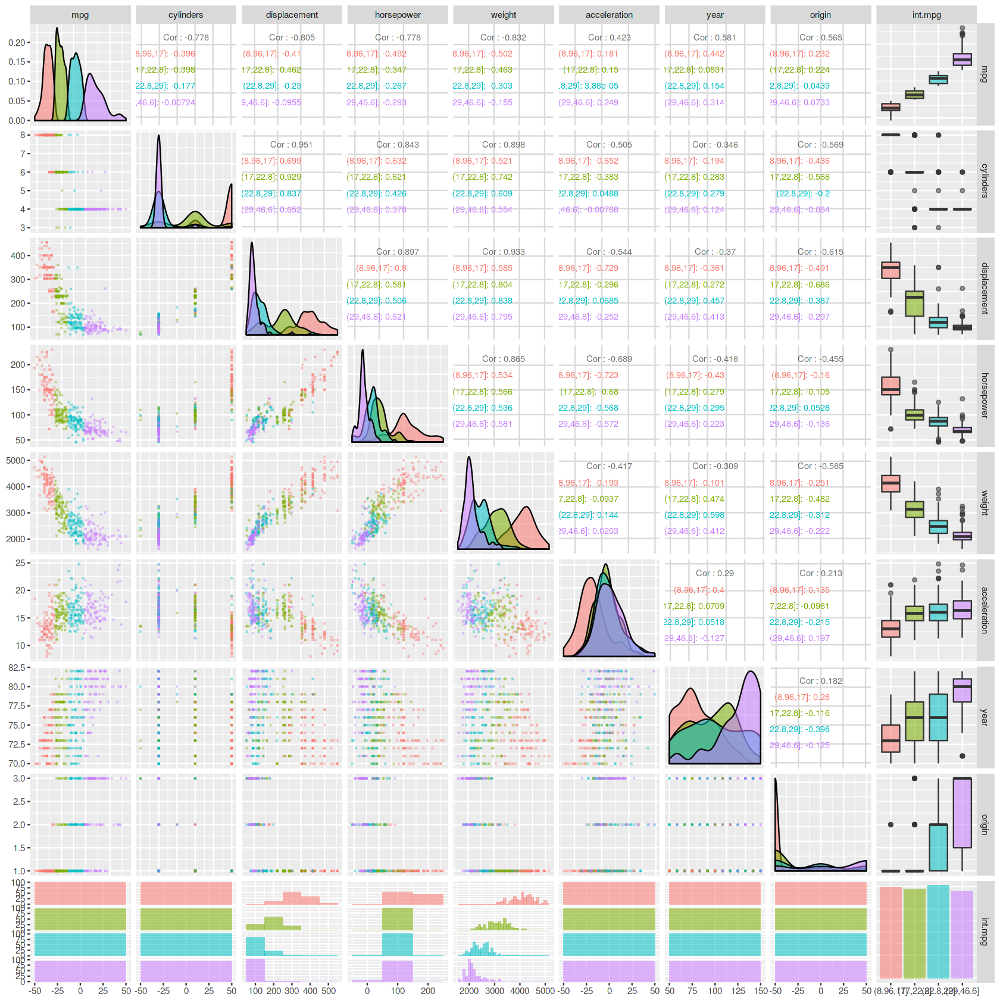

In [19]:
library("lsr")

options(repr.plot.width = 14, repr.plot.height = 14)

auto.pairs <- auto
auto.pairs$int.mpg <- quantileCut(auto.pairs$mpg, 4)

ggpairs(
    auto.pairs, 
    aes(alpha = 0.4, color = int.mpg),
    lower = list(
        combo = wrap("facethist", binwidth = 100), 
        continuous = wrap("points", alpha = 0.3, size = 0.3)), 
    upper = list(
        continuous = wrap("cor", size = 3)))

The higher the acceleration, the weight, and the horsepower, the less efficient the car is. As it consumes more fuel, the Miles Per Gallon decreases.

These features seem highly correlated to **MPG** measure. Let’s see the correlation matrix.

##### Correlation

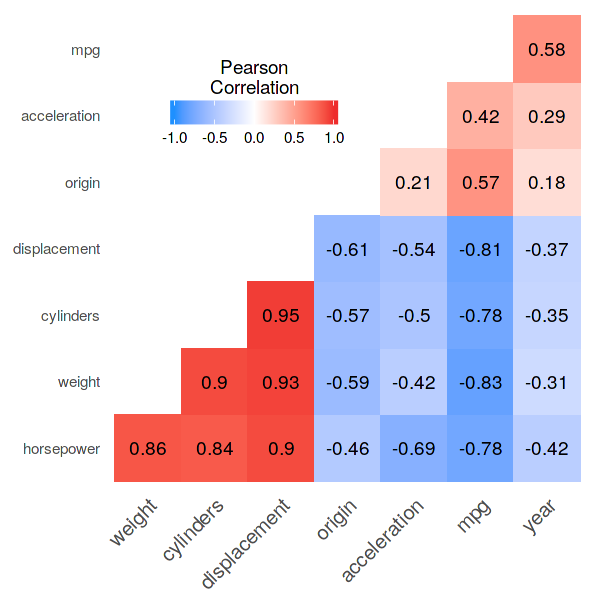

In [20]:
# Adapted from http://www.sthda.com/english/wiki/ggplot2-quick-correlation-matrix-heatmap-r-software-and-data-visualization
options(repr.plot.width = 5, repr.plot.height = 5)

get.upper.tri <- function(mat) {
    mat[upper.tri(mat)] <- NA
    diag(mat) <- NA
    mat
}

# Use correlation between variables as distance
reorder.corr <- function(mat){
    dd <- as.dist((1 - mat) / 2)
    hc <- hclust(dd)
    cormat <- mat[hc$order, hc$order]
}

corr <- round(cor(auto), 2)
corr <- reorder.corr(corr)
corr <- get.upper.tri(corr)
corr <- melt(corr, na.rm = TRUE)

ggplot(data = corr, aes(x = Var1, y = Var2, fill = value, label = value)) + 
    geom_tile() + 
    scale_fill_gradient2(
        low = "dodgerblue", 
        high = "firebrick2", 
        mid = "white", 
        midpoint = 0, 
        limit = c(-1, 1), 
        space = "Lab",
        name = "Pearson\nCorrelation") + 
    theme(
        axis.text.x = element_text(
            angle = 45, 
            vjust = 1, 
            size = 12, 
            hjust = 1)) + 
    coord_fixed() + 
    geom_text() + 
    theme(
        axis.title.x = element_blank(), 
        axis.title.y = element_blank(), 
        panel.background = element_blank(), 
        axis.ticks = element_blank(), 
        legend.justification = c(1, 0), 
        legend.position = c(0.5, 0.7), 
        legend.direction = "horizontal") + 
    guides(
        fill = guide_colorbar(
            barwidth = 7, 
            barheight = 1, 
            title.position = "top", 
            title.hjust = 0.5))

As the years passed, the cars have gotten more efficient in general. But they not necessarily have decreased in size or power.

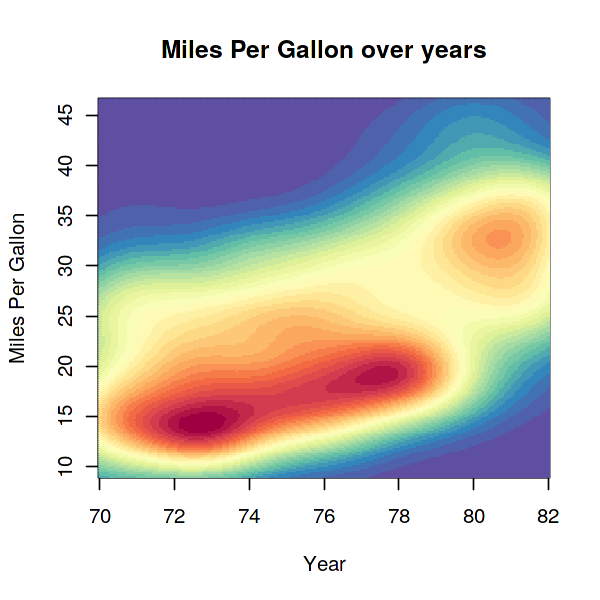

In [21]:
library("MASS")
library("RColorBrewer")

options(repr.plot.width = 5, repr.plot.height = 5)

rf <- colorRampPalette(rev(brewer.pal(11, "Spectral")))
r <- rf(32)

k <- kde2d(auto$year, auto$mpg, n = 200)
image(k, col = r, xlab = "Year", ylab = "Miles Per Gallon")
title("Miles Per Gallon over years")

It seems the MPG doubled in a decade. Let’s confirm.

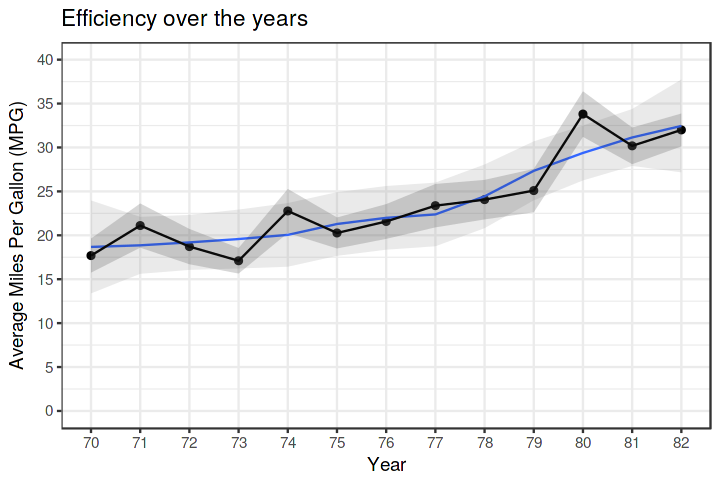

In [22]:
options(repr.plot.width = 6, repr.plot.height = 4)

by.year <- auto %>% 
    group_by(year) %>% 
    summarise(
        n = n(),
        mpg.mean = mean(mpg), 
        mpg.sd = sd(mpg))
by.year$mpg.min <- by.year$mpg.mean - 1.96 * by.year$mpg.sd / sqrt(by.year$n)
by.year$mpg.max <- by.year$mpg.mean + 1.96 * by.year$mpg.sd / sqrt(by.year$n)

ggplot(by.year, aes(year, mpg.mean)) + 
    theme_bw() +
    geom_point() +
    geom_smooth(method = "loess", size = 0.5, alpha = 0.2) +
    geom_line() + 
    geom_ribbon(aes(ymin = mpg.min, ymax = mpg.max), alpha = 0.2) +
    scale_y_continuous(limit = c(0, 40), breaks = seq(0, 40, 5)) +
    scale_x_discrete(limit = by.year$year) +
    scale_fill_manual(name="Bla",
        values=c(mpg.mean="#008B00")) +
    xlab("Year") +
    ylab("Average Miles Per Gallon (MPG)") +
    ggtitle("Efficiency over the years") 

Visually I would say the MPG increased by 10 gallons in a decade, from ~29 in 1970 to ~29 (the smooth line) in 1980. I prefer using the smooth line than the observed data because the average fell down in 1981.

(f) Suppose that we wish to predict gas mileage (**mpg**) on the basis of the other variables. Do your plots suggest that any of the other variables might be useful in predicting **mpg**? Justify your answer.

Yes, the 1970s decade had a great improvement on the car engines and the plots suggest the specification of engines can predict the fuel efficiency.

### Exercise 10: The Boston data set

In [23]:
library("MASS")

data(Boston)

#### Exercise 10a

How many rows are in this data set? How many columns? What
do the rows and columns represent?

Description collected from the manual, `?Boston`. This a data set of housing values in Boston suburbs.

**Variable** | **Description**
:- | :-
**crim** | per capita crime rate by town.
**zn** | proportion of residential land zoned for lots over 25,000 sq.ft.
**indus** | proportion of non-retail business acres per town.
**chas** | Charles River dummy variable (= 1 if tract bounds river; 0 otherwise).
**nox** | $NO_x$, nitrogen oxides concentration (parts per 10 million).
**rm** | average number of rooms per dwelling.
**age** | proportion of owner-occupied units built prior to 1940.
**dis** | weighted mean of distances to five Boston employment centres.
**rad** | index of accessibility to radial highways.
**tax** | full-value property-tax rate per \$10,000.
**ptratio** | pupil-teacher ratio by town.
**black** | $1000(Bk - 0.63)^2$ where $Bk$ is the proportion of blacks by town.
**lstat** | lower status of the population (percent).
**medv** | median value of owner-occupied homes in \$1000s.


In [24]:
dim(Boston)

[1] 506  14

In [25]:
head(Boston)

crim,zn,indus,chas,nox,rm,age,dis,rad,tax,ptratio,black,lstat,medv
0.00632,18,2.31,0,0.538,6.575,65.2,4.0900,1,296,15.3,396.90,4.98,24.0
0.02731,0,7.07,0,0.469,6.421,78.9,4.9671,2,242,17.8,396.90,9.14,21.6
0.02729,0,7.07,0,0.469,7.185,61.1,4.9671,2,242,17.8,392.83,4.03,34.7
0.03237,0,2.18,0,0.458,6.998,45.8,6.0622,3,222,18.7,394.63,2.94,33.4
0.06905,0,2.18,0,0.458,7.147,54.2,6.0622,3,222,18.7,396.90,5.33,36.2
0.02985,0,2.18,0,0.458,6.430,58.7,6.0622,3,222,18.7,394.12,5.21,28.7


#### Exercise 10b

(b) Make some pairwise scatterplots of the predictors (columns) in
this data set. Describe your findings.

Let’s start discretizing the crime rate into four quantiles.

In [26]:
table(quantileCut(Boston$crim, 4))


(-0.0826,0.082]   (0.082,0.257]    (0.257,3.68]     (3.68,89.1] 
            127             126             126             127 

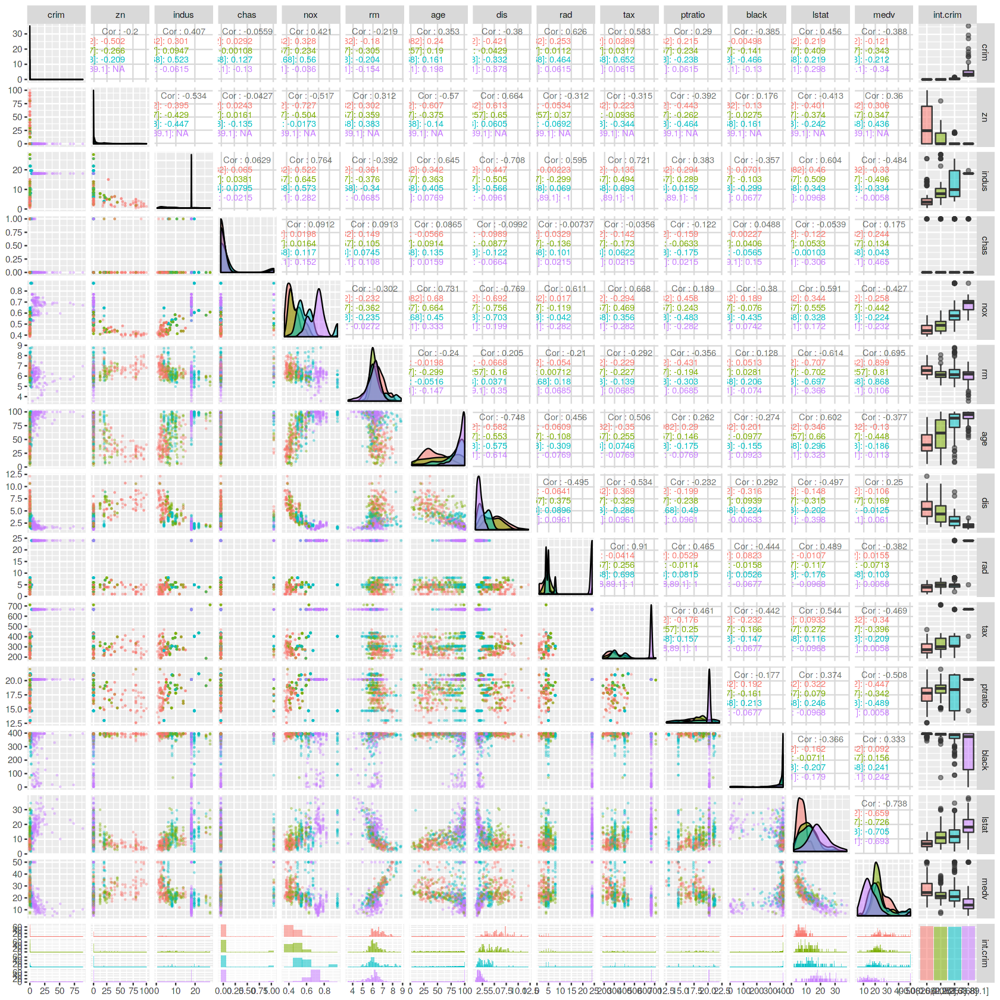

In [27]:
options(repr.plot.width = 14, repr.plot.height = 14)

boston.pairs <- Boston
boston.pairs$int.crim <- quantileCut(boston.pairs$crim, 4)

suppressWarnings(print(ggpairs(
    boston.pairs, 
    aes(alpha = 0.4, color = int.crim),
    lower = list(
        combo = wrap("facethist", binwidth = 0.1), 
        continuous = wrap("points", alpha = 0.3, size = 0.3)), 
    upper = list(
        continuous = wrap("cor", size = 3)))))

Lower status of population (**lstat**) and average number of rooms per dwelling (**rm**) are strongly correlated with the median value of owner-occupied homes in \$1000s (**medv**). Let’s visualize the correlation with the correlation matrix. 

It seems some features have many constant values. Let’s check this with a heat map of the values.

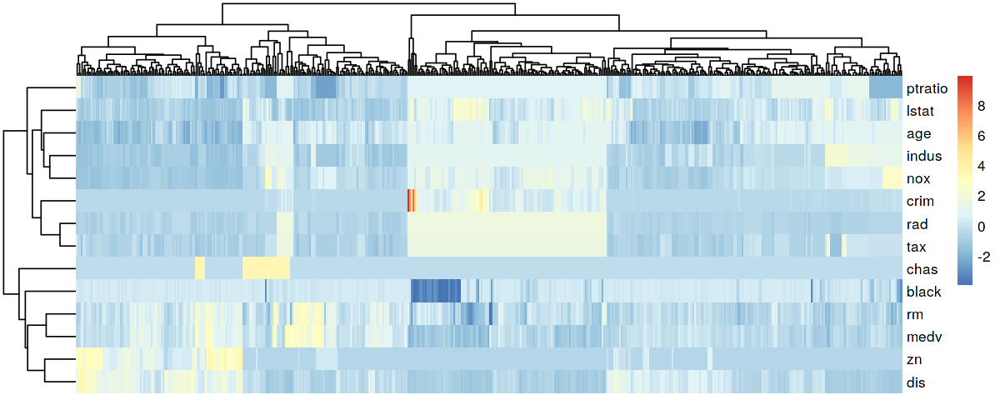

In [28]:
library("pheatmap")

options(repr.plot.width = 10, repr.plot.height = 4)

pheatmap(t(scale(Boston)), show_colnames = FALSE)

Indeed, the correlation dendrogram of columns above shows that some features 
have many constant values at the same time, implying the existance of colinear predictors. 

Note how the index of accessibility to radial highways (**rad**) and 
the full-value property-tax rate per \$10,000 (**tax**) have a constant value 
together. The pupil–teacher ration (**ptratio**) also seem to be constant at the same times —
observe the upper dendrogram of rows. However, **ptratio** 
is clustered way after (**rad**, **tax**) were.

Let’s see which values **rad** and **tax** assume.

In [29]:
library("IRdisplay")

display_markdown("##### rad")
summary(Boston$rad)
table(Boston$rad)

display_markdown("##### tax")
summary(Boston$tax)
tax.table <- table(Boston$tax)
tax.table[tax.table > 10]

display_markdown("##### ptratio")
summary(Boston$ptratio)
ptratio.table <- table(Boston$ptratio)
ptratio.table[ptratio.table > 10]

##### rad

   Min. 1st Qu.  Median    Mean 3rd Qu.    Max. 
  1.000   4.000   5.000   9.549  24.000  24.000 


  1   2   3   4   5   6   7   8  24 
 20  24  38 110 115  26  17  24 132 

##### tax

   Min. 1st Qu.  Median    Mean 3rd Qu.    Max. 
  187.0   279.0   330.0   408.2   666.0   711.0 


264 277 304 307 384 398 403 437 666 
 12  11  14  40  11  12  30  15 132 

##### ptratio

   Min. 1st Qu.  Median    Mean 3rd Qu.    Max. 
  12.60   17.40   19.05   18.46   20.20   22.00 


  13 14.7 15.2 16.6 17.4 17.8 17.9 18.4 18.6 19.1 19.2 20.2 20.9   21 21.2 
  12   34   13   16   18   23   11   16   17   17   19  140   11   27   15 

It looks like when **rad** is 24, **tax** is 666. Let’s confirm and also get
the values for **ptratio**.

In [30]:
rad.rows <- Boston$rad == 24
tax.rows <- Boston$tax == 666
ptratio.rows <- Boston$ptratio == 20.2

cbind(apply(Boston[rad.rows, c("rad", "tax", "ptratio")], 2, summary),
      apply(Boston[tax.rows, c("rad", "tax", "ptratio")], 2, summary),
      apply(Boston[ptratio.rows, c("rad", "tax", "ptratio")], 2, summary))

,rad,tax,ptratio,rad,tax,ptratio,rad,tax,ptratio
Min.,24,666,20.2,24,666,20.2,5.00000,224.0000,20.2
1st Qu.,24,666,20.2,24,666,20.2,24.00000,666.0000,20.2
Median,24,666,20.2,24,666,20.2,24.00000,666.0000,20.2
Mean,24,666,20.2,24,666,20.2,22.91429,640.7429,20.2
3rd Qu.,24,666,20.2,24,666,20.2,24.00000,666.0000,20.2
Max.,24,666,20.2,24,666,20.2,24.00000,666.0000,20.2


So, we know that if **rad** is 24, then **rad** is 666, and the other way around also holds.

We can also say that if **rad** is 24, then **ptratio** is 666, but the back is not true because there is at least a **rad** and **tax** with values 5 and 224 when **ptratio**  is 666.

Now we can have some initial insights (that need to be verified):

Regarding the median house values (**medv**):
- Houses with more rooms (**rm**) are more expensive (**medv**)
- Poorer areas (**lstat**) reduce the price of houses 
- Expensive houses have a lower tax rate, perhaps because the tax is limited to a value.
- The atmospheric chemistry (**nox**) is a measure of nitric oxide (NO) and nitrogen dioxide (NO2) in the area. Industrial areas of town centers can have a higher concentration, which is associated with a reduced price of houses. In fact, the proportion of non-retail business acres per town (**indus**) has a high correlation with **nox**.
- The pupil–teacher ratio by town (**ptarion**) seems to be related with **proportion of residential land zoned**

#### Exercise 10c

Are any of the predictors associated with per capita crime rate?
If so, explain the relationship.

Let’s plot the correlation matrix.

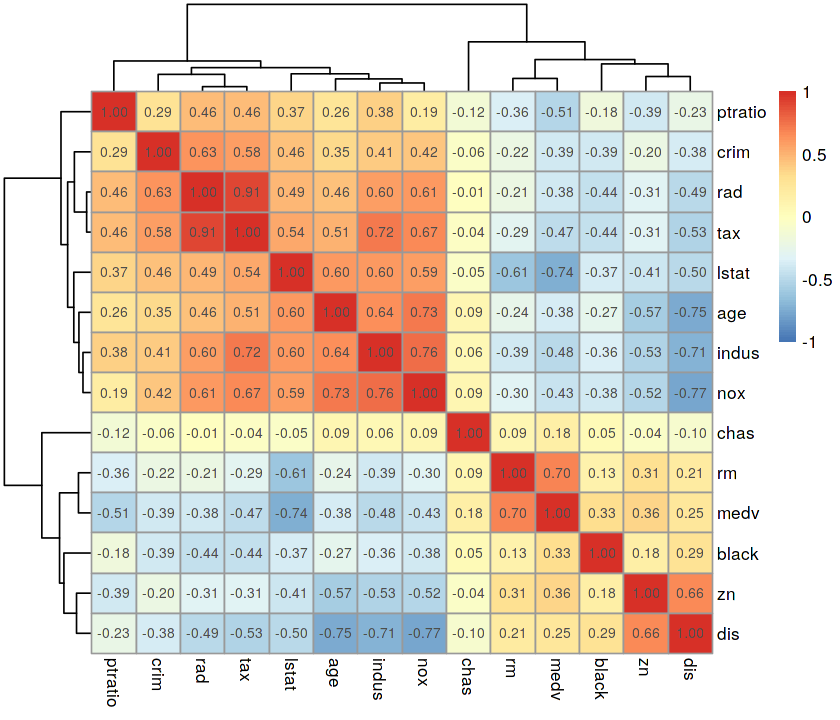

In [31]:
options(repr.plot.width = 7, repr.plot.height = 6)

pheatmap(cor(Boston, use="pairwise.complete.obs"), 
         display_numbers = TRUE,
         breaks = seq(-1, 1, 0.02))

These predictors seem to be related to the crime rate:

- Positive, higher than 0.3: **rad, tax, lstat, age, indus, nox**
- Negative, lower than -0.3: **medv, black, dis**

Alternatively, we can build this matrix using `ggplot`.

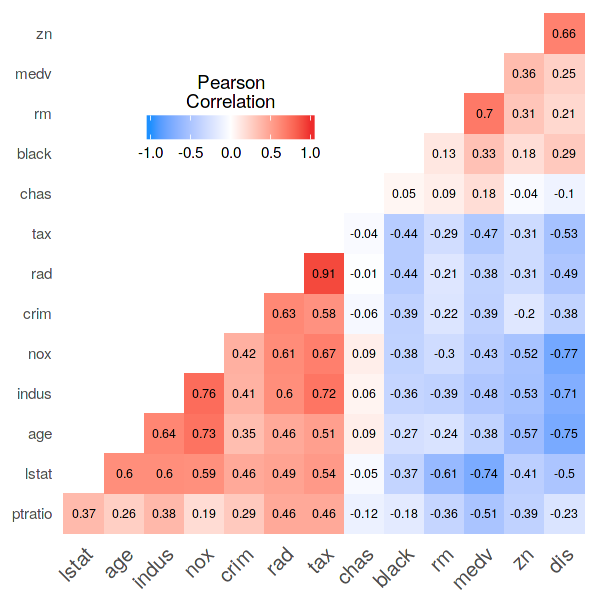

In [32]:
# Adapted from http://www.sthda.com/english/wiki/ggplot2-quick-correlation-matrix-heatmap-r-software-and-data-visualization
options(repr.plot.width = 5, repr.plot.height = 5)

get.upper.tri <- function(mat) {
    mat[upper.tri(mat)] <- NA
    diag(mat) <- NA
    mat
}

# Use correlation between variables as distance
reorder.corr <- function(mat){
    dd <- as.dist((1 - mat) / 2)
    hc <- hclust(dd)
    cormat <- mat[hc$order, hc$order]
}

corr <- round(cor(Boston), 2)
corr <- reorder.corr(corr)
corr <- get.upper.tri(corr)
corr <- melt(corr, na.rm = TRUE)

ggplot(data = corr, aes(x = Var1, y = Var2, fill = value, label = value)) + 
    geom_tile() + 
    scale_fill_gradient2(
        low = "dodgerblue", 
        high = "firebrick2", 
        mid = "white", 
        midpoint = 0, 
        limit = c(-1, 1), 
        space = "Lab",
        name = "Pearson\nCorrelation") + 
    theme(
        axis.text.x = element_text(
            angle = 45, 
            vjust = 1, 
            size = 12, 
            hjust = 1)) + 
    coord_fixed() + 
    geom_text(size = 2.5) + 
    theme(
        axis.title.x = element_blank(), 
        axis.title.y = element_blank(), 
        panel.background = element_blank(), 
        axis.ticks = element_blank(), 
        legend.justification = c(1, 0), 
        legend.position = c(0.5, 0.7), 
        legend.direction = "horizontal") + 
    guides(
        fill = guide_colorbar(
            barwidth = 7, 
            barheight = 1, 
            title.position = "top", 
            title.hjust = 0.5))

#### Exercise 10d

Do any of the suburbs of Boston appear to have particularly
high crime rates? Tax rates? Pupil–teacher ratios? Comment on
the range of each predictor.

##### High crime rates

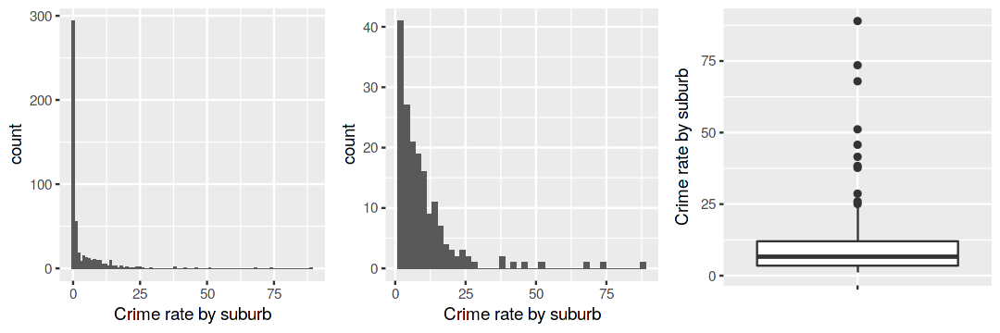

In [33]:
library("gridExtra")

options(repr.plot.width = 9, repr.plot.height = 3)

large.crim <- Boston[Boston$crim > 1, ]

# Plot all values
p1 <- ggplot(Boston, aes(crim)) + geom_histogram(binwidth = 1) +
    xlab("Crime rate by suburb")
# Plot only crime rates above 1
p2 <- ggplot(large.crim, aes(crim)) +  geom_histogram(binwidth = 2) +
    xlab("Crime rate by suburb")
p3 <- ggplot(large.crim, aes(x = "", y = crim)) + geom_boxplot() +
    xlab("") +
    ylab("Crime rate by suburb")

grid.arrange(p1, p2, p3, ncol = 3)

The suburds that seem to have high crime rates far higher than the others 
are those which the crime rate exceeds 25%:

In [34]:
which(Boston$crim > 25)

[1] 381 399 401 405 406 411 414 415 418 419 428

##### Tax rates

In [35]:
table(Boston$tax)


187 188 193 198 216 222 223 224 226 233 241 242 243 244 245 247 252 254 255 256 264 265 270 273 276 277 279 280 281 284 285 287 289 293 296 300 304 305 307 311 313 315 329 330 334 335 337 345 348 351 
  1   7   8   1   5   7   5  10   1   9   1   2   4   1   3   4   2   5   1   1  12   2   7   5   9  11   4   1   4   7   1   8   5   3   8   7  14   4  40   7   1   2   6  10   2   2   2   3   2   1 
352 358 370 384 391 398 402 403 411 422 430 432 437 469 666 711 
  2   3   2  11   8  12   2  30   2   1   3   9  15   1 132   5 

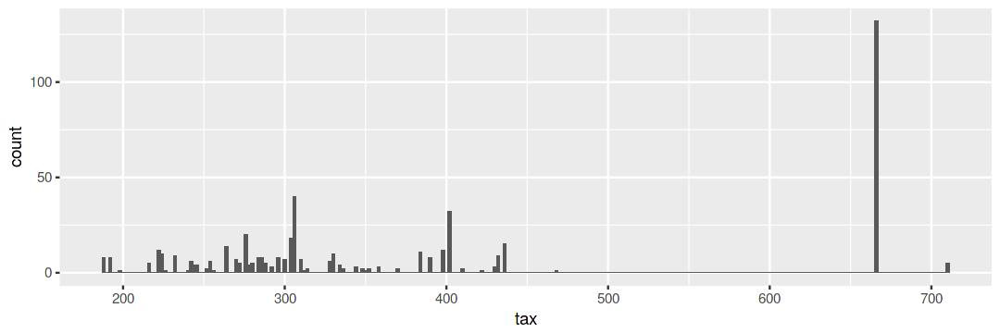

In [36]:
ggplot(Boston, aes(tax)) + geom_histogram(binwidth = 2)

Although 666 looked an outlier, there are a few tax vaues even higher, 711.
If actual values, they are quite high compared to the the rest.

##### Pupil–Teacher Ratio

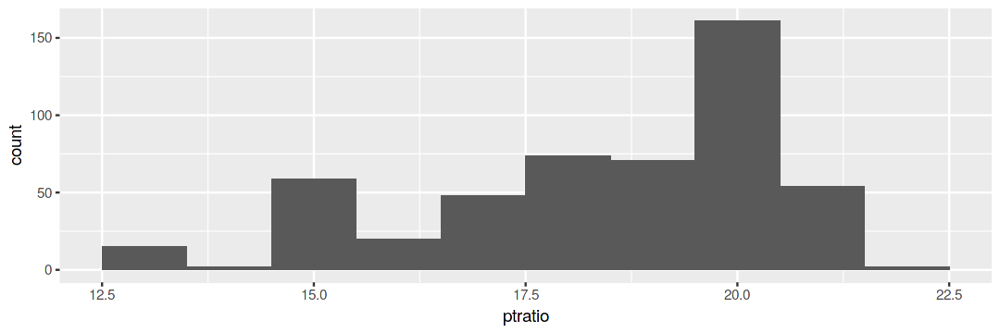

In [37]:
ggplot(Boston, aes(ptratio)) + geom_histogram(binwidth = 1)

Since 22.5 pupils for each teacher is acceptable, the pupil–teacher ratio looks 
without high ratios.

#### Exercise 10e

How many of the suburbs in this data set bound the Charles
river?

In [38]:
table(Boston$chas)


  0   1 
471  35 

#### Exercise 10f

What is the median pupil-teacher ratio among the towns in this data set?

In [39]:
median(Boston$ptratio)

[1] 19.05

#### Exercise 10g

Which suburb of Boston has lowest median value of owner-occupied homes? 
What are the values of the other predictors
for that suburb, and how do those values compare to the overall
ranges for those predictors? Comment on your findings.

In [40]:
lowest.suburb <- Boston[which.min(Boston$medv), ]
lowest.suburb

,crim,zn,indus,chas,nox,rm,age,dis,rad,tax,ptratio,black,lstat,medv
399,38.3518,0,18.1,0,0.693,5.453,100,1.4896,24,666,20.2,396.9,30.59,5


Let’s draw the histogram for each predictor with a red, dashed vertical line
marking the position of the surburb with lowest median housing value.

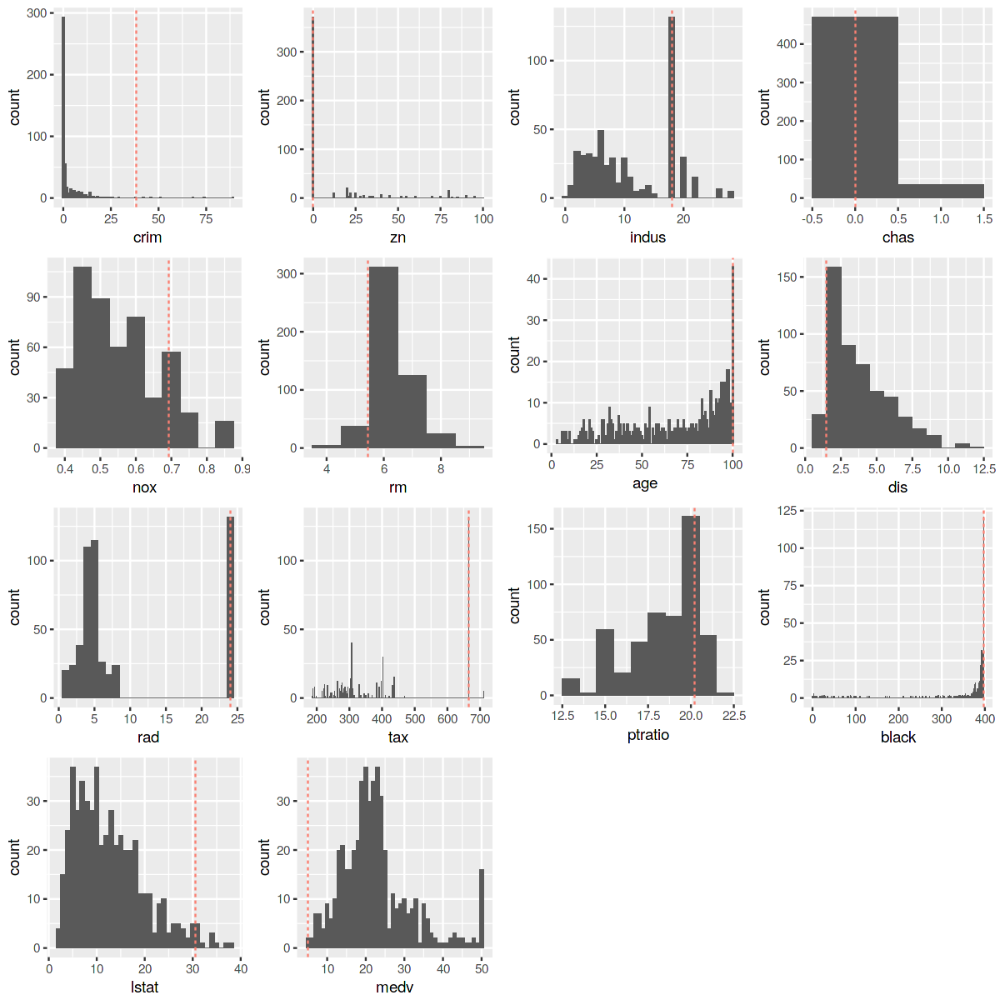

In [41]:
options(repr.plot.width = 10, repr.plot.height = 10)

plots <- list()
for (pred in colnames(Boston)) {
    bin.width <- 1
    if (pred %in% c("nox")) bin.width <- 0.05
    p <- ggplot(Boston, aes_string(x = pred)) + 
        geom_histogram(binwidth = bin.width) +
        geom_vline(xintercept = get(pred, lowest.suburb), 
                   linetype = "dashed", 
                   color = "salmon")
    plots <- c(plots, list(p))
}

do.call("grid.arrange", c(plots, ncol = 4))

This seems to be an old suburb of blacks that is not currently 
residential, with a high crime rate.

The tax rate seems to be placed quite high, but as we saw earlier, a **tax**
can actually be a missing value.

In [42]:
ecdf(Boston$nox)(lowest.suburb$nox)

[1] 0.8577075

Additionally, this could be an industrial area because the **nox** is located at the 86% percentile.

#### Exercise 10h

In this data set, how many of the suburbs average more than
seven rooms per dwelling? More than eight rooms per dwelling?
Comment on the suburbs that average more than eight rooms
per dwelling.

In [43]:
rooms <- ceiling(Boston$rm)
table(rooms)

rooms
  4   5   6   7   8   9 
  2  14 157 269  51  13 

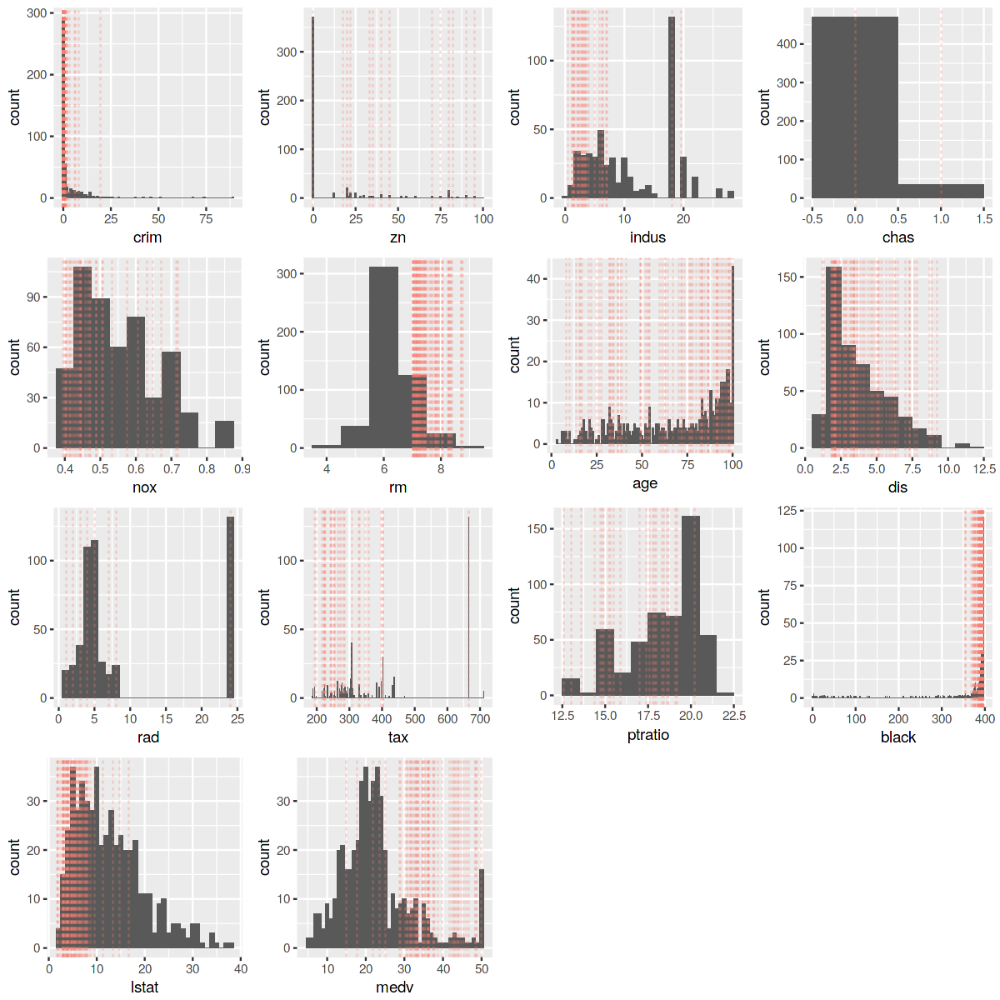

In [44]:
options(repr.plot.width = 10, repr.plot.height = 10)

plots <- list()
for (pred in colnames(Boston)) {
    bin.width <- 1
    if (pred %in% c("nox")) bin.width <- 0.05
    p <- ggplot(Boston, aes_string(x = pred)) + 
        geom_histogram(binwidth = bin.width) +
        geom_vline(xintercept = get(pred, Boston[which(rooms > 7), ]),
                   linetype = "dashed", 
                   color = "salmon",
                   alpha = 0.3)
    plots <- c(plots, list(p))
}

do.call("grid.arrange", c(plots, ncol = 4))

These refer to suburbs with the largest and most expensive houses.

# Chapter 3. Linear Regression

## Lab

In [45]:
library("MASS")
library("ISLR")

### Simple Linear Regression

In [46]:
head(Boston)

crim,zn,indus,chas,nox,rm,age,dis,rad,tax,ptratio,black,lstat,medv
0.00632,18,2.31,0,0.538,6.575,65.2,4.0900,1,296,15.3,396.90,4.98,24.0
0.02731,0,7.07,0,0.469,6.421,78.9,4.9671,2,242,17.8,396.90,9.14,21.6
0.02729,0,7.07,0,0.469,7.185,61.1,4.9671,2,242,17.8,392.83,4.03,34.7
0.03237,0,2.18,0,0.458,6.998,45.8,6.0622,3,222,18.7,394.63,2.94,33.4
0.06905,0,2.18,0,0.458,7.147,54.2,6.0622,3,222,18.7,396.90,5.33,36.2
0.02985,0,2.18,0,0.458,6.430,58.7,6.0622,3,222,18.7,394.12,5.21,28.7


Let’s try to predict **medv** using the others as predictors.

In [47]:
lm.fit <- lm(medv ~ lstat, data = Boston)
lm.fit


Call:
lm(formula = medv ~ lstat, data = Boston)

Coefficients:
(Intercept)        lstat  
      34.55        -0.95  


In [48]:
summary(lm.fit)


Call:
lm(formula = medv ~ lstat, data = Boston)

Residuals:
    Min      1Q  Median      3Q     Max 
-15.168  -3.990  -1.318   2.034  24.500 

Coefficients:
            Estimate Std. Error t value Pr(>|t|)    
(Intercept) 34.55384    0.56263   61.41   <2e-16 ***
lstat       -0.95005    0.03873  -24.53   <2e-16 ***
---
Signif. codes:  0 ‘***’ 0.001 ‘**’ 0.01 ‘*’ 0.05 ‘.’ 0.1 ‘ ’ 1

Residual standard error: 6.216 on 504 degrees of freedom
Multiple R-squared:  0.5441,	Adjusted R-squared:  0.5432 
F-statistic: 601.6 on 1 and 504 DF,  p-value: < 2.2e-16


In [49]:
coef(lm.fit)

(Intercept)       lstat 
 34.5538409  -0.9500494

Confidence interval of the coefficient estimates.

In [50]:
confint(lm.fit)

,2.5 %,97.5 %
(Intercept),33.448457,35.6592247
lstat,-1.026148,-0.8739505


In [51]:
display_markdown("#### Confidence Intervals")
predict(lm.fit, data.frame(lstat = c(5, 10, 15)), interval = "confidence")
display_markdown("#### Prediction Intervals")
predict(lm.fit, data.frame(lstat = c(5, 10, 15)), interval = "prediction")

#### Confidence Intervals

,fit,lwr,upr
1,29.80359,29.00741,30.59978
2,25.05335,24.47413,25.63256
3,20.30310,19.73159,20.87461


#### Prediction Intervals

,fit,lwr,upr
1,29.80359,17.565675,42.04151
2,25.05335,12.827626,37.27907
3,20.30310,8.077742,32.52846


To remember, *prediction intervals* are always wider than the 
*confidence intervals*.

Remember we are approximating $y = f(x) + \epsilon$. Thus:

- **Confidence interval**: quantify the uncertainty of the surrounding the 
    *average*.  We interpret it as 95% of the confidence intervals will contain
    the actual $f(X)$.
- **Prediction interval**: even if we knew the actual $f(X)$, how much the
    prediction would vary? This is the prediction error plus the irreducible
    error $\epsilon$. We interpret it as 95% of the prediction intervals will contain 
    $y$.


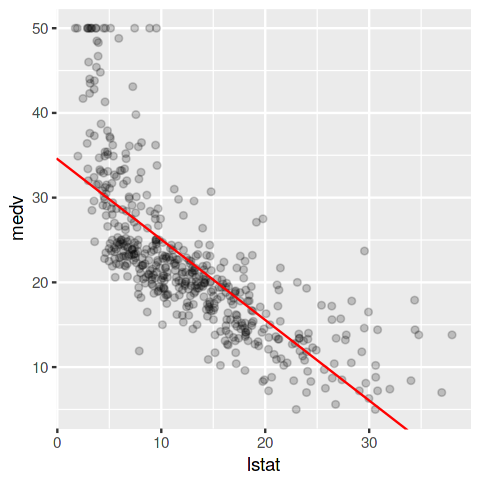

In [52]:
options(repr.plot.width = 4, repr.plot.height = 4)

ggplot(Boston, aes(lstat, medv)) + 
    geom_point(alpha = 0.2) +
    geom_abline(
        intercept = coef(lm.fit)[1],
        slope = coef(lm.fit)[2],
        colour = "red")

This looks somewhat non-linear.

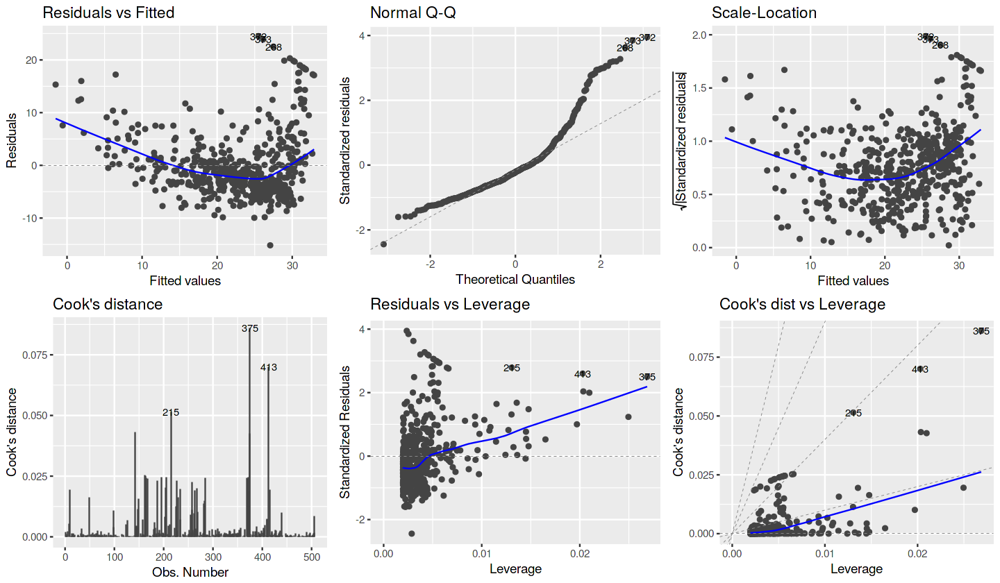

In [53]:
library("ggfortify")

options(repr.plot.width = 12, repr.plot.height = 7)

autoplot(lm.fit, which = 1:6, ncol = 3, label.size = 3)

- **Residuals × Fitted**: Evidence of a non-linear relationship
- **Normal Q–Q**: The Q–Q plot of the residuals shows that they are not normally distributed, otherwise would follow a straight line.
- **Scale–Location**: This plot is useful to check for homoscedasticity. In this case, the residuals show a heterocedasticity spread, because the are concentrated in some values and more spread in others.
- **Residuals × Leverage**: This plot helps find influential observations, which can be outliers. There are not visible outliers in this data.

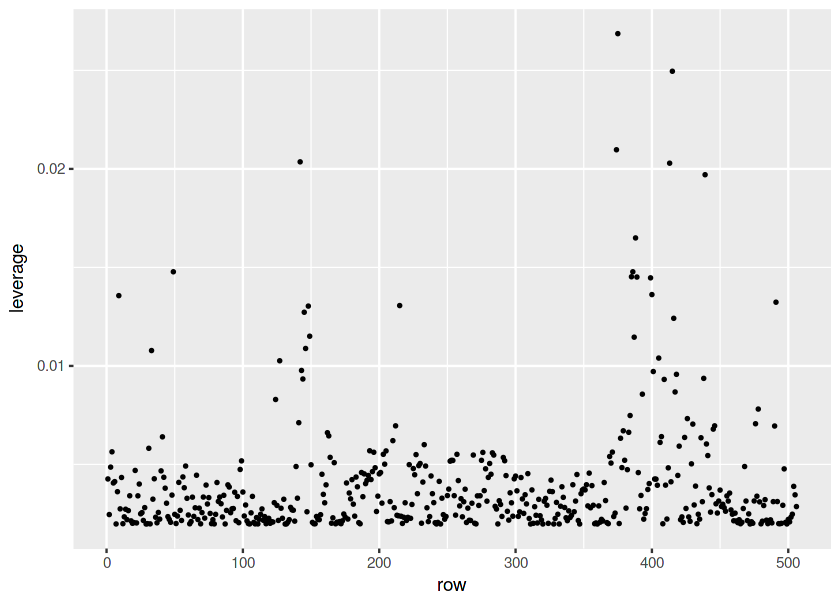

In [54]:
options(repr.plot.width = 7, repr.plot.height = 5)
leverage <- cbind(row=1:nrow(Boston), leverage=hatvalues(lm.fit))
ggplot(leverage, aes(row, leverage)) + geom_point(size = 0.5)

### Multiple Linear Regression

In [55]:
lm.fit <- lm(medv ~ lstat + age, data = Boston)
summary(lm.fit)


Call:
lm(formula = medv ~ lstat + age, data = Boston)

Residuals:
    Min      1Q  Median      3Q     Max 
-15.981  -3.978  -1.283   1.968  23.158 

Coefficients:
            Estimate Std. Error t value Pr(>|t|)    
(Intercept) 33.22276    0.73085  45.458  < 2e-16 ***
lstat       -1.03207    0.04819 -21.416  < 2e-16 ***
age          0.03454    0.01223   2.826  0.00491 ** 
---
Signif. codes:  0 ‘***’ 0.001 ‘**’ 0.01 ‘*’ 0.05 ‘.’ 0.1 ‘ ’ 1

Residual standard error: 6.173 on 503 degrees of freedom
Multiple R-squared:  0.5513,	Adjusted R-squared:  0.5495 
F-statistic:   309 on 2 and 503 DF,  p-value: < 2.2e-16


In [56]:
lm.fit <- lm(medv ~ ., data = Boston)
summary(lm.fit)


Call:
lm(formula = medv ~ ., data = Boston)

Residuals:
    Min      1Q  Median      3Q     Max 
-15.595  -2.730  -0.518   1.777  26.199 

Coefficients:
              Estimate Std. Error t value Pr(>|t|)    
(Intercept)  3.646e+01  5.103e+00   7.144 3.28e-12 ***
crim        -1.080e-01  3.286e-02  -3.287 0.001087 ** 
zn           4.642e-02  1.373e-02   3.382 0.000778 ***
indus        2.056e-02  6.150e-02   0.334 0.738288    
chas         2.687e+00  8.616e-01   3.118 0.001925 ** 
nox         -1.777e+01  3.820e+00  -4.651 4.25e-06 ***
rm           3.810e+00  4.179e-01   9.116  < 2e-16 ***
age          6.922e-04  1.321e-02   0.052 0.958229    
dis         -1.476e+00  1.995e-01  -7.398 6.01e-13 ***
rad          3.060e-01  6.635e-02   4.613 5.07e-06 ***
tax         -1.233e-02  3.760e-03  -3.280 0.001112 ** 
ptratio     -9.527e-01  1.308e-01  -7.283 1.31e-12 ***
black        9.312e-03  2.686e-03   3.467 0.000573 ***
lstat       -5.248e-01  5.072e-02 -10.347  < 2e-16 ***
---
Signif. codes:  0

In [57]:
library("car")

vif(lm.fit)

crim       zn    indus     chas      nox       rm      age      dis      rad      tax  ptratio    black    lstat 
1.792192 2.298758 3.991596 1.073995 4.393720 1.933744 3.100826 3.955945 7.484496 9.008554 1.799084 1.348521 2.941491

In [58]:
lm.fit <- lm(medv ~ . - age, data = Boston)
summary(lm.fit)


Call:
lm(formula = medv ~ . - age, data = Boston)

Residuals:
     Min       1Q   Median       3Q      Max 
-15.6054  -2.7313  -0.5188   1.7601  26.2243 

Coefficients:
              Estimate Std. Error t value Pr(>|t|)    
(Intercept)  36.436927   5.080119   7.172 2.72e-12 ***
crim         -0.108006   0.032832  -3.290 0.001075 ** 
zn            0.046334   0.013613   3.404 0.000719 ***
indus         0.020562   0.061433   0.335 0.737989    
chas          2.689026   0.859598   3.128 0.001863 ** 
nox         -17.713540   3.679308  -4.814 1.97e-06 ***
rm            3.814394   0.408480   9.338  < 2e-16 ***
dis          -1.478612   0.190611  -7.757 5.03e-14 ***
rad           0.305786   0.066089   4.627 4.75e-06 ***
tax          -0.012329   0.003755  -3.283 0.001099 ** 
ptratio      -0.952211   0.130294  -7.308 1.10e-12 ***
black         0.009321   0.002678   3.481 0.000544 ***
lstat        -0.523852   0.047625 -10.999  < 2e-16 ***
---
Signif. codes:  0 ‘***’ 0.001 ‘**’ 0.01 ‘*’ 0.05 ‘.’ 0.1

### Interaction Terms

In [59]:
summary(lm(medv ~ lstat * age, data = Boston))


Call:
lm(formula = medv ~ lstat * age, data = Boston)

Residuals:
    Min      1Q  Median      3Q     Max 
-15.806  -4.045  -1.333   2.085  27.552 

Coefficients:
              Estimate Std. Error t value Pr(>|t|)    
(Intercept) 36.0885359  1.4698355  24.553  < 2e-16 ***
lstat       -1.3921168  0.1674555  -8.313 8.78e-16 ***
age         -0.0007209  0.0198792  -0.036   0.9711    
lstat:age    0.0041560  0.0018518   2.244   0.0252 *  
---
Signif. codes:  0 ‘***’ 0.001 ‘**’ 0.01 ‘*’ 0.05 ‘.’ 0.1 ‘ ’ 1

Residual standard error: 6.149 on 502 degrees of freedom
Multiple R-squared:  0.5557,	Adjusted R-squared:  0.5531 
F-statistic: 209.3 on 3 and 502 DF,  p-value: < 2.2e-16


### Non-linear Transformations of the Predictors

In [60]:
lm.fit2 <- lm(medv ~ lstat + I(lstat^2), data = Boston)
summary(lm.fit2)


Call:
lm(formula = medv ~ lstat + I(lstat^2), data = Boston)

Residuals:
     Min       1Q   Median       3Q      Max 
-15.2834  -3.8313  -0.5295   2.3095  25.4148 

Coefficients:
             Estimate Std. Error t value Pr(>|t|)    
(Intercept) 42.862007   0.872084   49.15   <2e-16 ***
lstat       -2.332821   0.123803  -18.84   <2e-16 ***
I(lstat^2)   0.043547   0.003745   11.63   <2e-16 ***
---
Signif. codes:  0 ‘***’ 0.001 ‘**’ 0.01 ‘*’ 0.05 ‘.’ 0.1 ‘ ’ 1

Residual standard error: 5.524 on 503 degrees of freedom
Multiple R-squared:  0.6407,	Adjusted R-squared:  0.6393 
F-statistic: 448.5 on 2 and 503 DF,  p-value: < 2.2e-16


Hypothesis test. Null hypothesis is that the `lm.fit2` fits the data equally well as `lm.fit`. 
The alternative hypethesis is that the `lm.fit2` is superior.

In [61]:
lm.fit <- lm(medv ~ lstat, data = Boston)
anova(lm.fit, lm.fit2)

Res.Df,RSS,Df,Sum of Sq,F,Pr(>F)
504,19472.38,NA,NA,NA,NA
503,15347.24,1,4125.138,135.1998,7.630116e-28


The **F** is 135 with a *p* pratically zero. We reject the null hypothesis.
Thus, the **lstat**² improved a lot the model.

In [62]:
lm.fit5 <- lm(medv ~ poly(lstat, 5), data = Boston)
summary(lm.fit5)


Call:
lm(formula = medv ~ poly(lstat, 5), data = Boston)

Residuals:
     Min       1Q   Median       3Q      Max 
-13.5433  -3.1039  -0.7052   2.0844  27.1153 

Coefficients:
                 Estimate Std. Error t value Pr(>|t|)    
(Intercept)       22.5328     0.2318  97.197  < 2e-16 ***
poly(lstat, 5)1 -152.4595     5.2148 -29.236  < 2e-16 ***
poly(lstat, 5)2   64.2272     5.2148  12.316  < 2e-16 ***
poly(lstat, 5)3  -27.0511     5.2148  -5.187 3.10e-07 ***
poly(lstat, 5)4   25.4517     5.2148   4.881 1.42e-06 ***
poly(lstat, 5)5  -19.2524     5.2148  -3.692 0.000247 ***
---
Signif. codes:  0 ‘***’ 0.001 ‘**’ 0.01 ‘*’ 0.05 ‘.’ 0.1 ‘ ’ 1

Residual standard error: 5.215 on 500 degrees of freedom
Multiple R-squared:  0.6817,	Adjusted R-squared:  0.6785 
F-statistic: 214.2 on 5 and 500 DF,  p-value: < 2.2e-16


In [63]:
summary(lm(medv ~ log(rm), data = Boston))


Call:
lm(formula = medv ~ log(rm), data = Boston)

Residuals:
    Min      1Q  Median      3Q     Max 
-19.487  -2.875  -0.104   2.837  39.816 

Coefficients:
            Estimate Std. Error t value Pr(>|t|)    
(Intercept)  -76.488      5.028  -15.21   <2e-16 ***
log(rm)       54.055      2.739   19.73   <2e-16 ***
---
Signif. codes:  0 ‘***’ 0.001 ‘**’ 0.01 ‘*’ 0.05 ‘.’ 0.1 ‘ ’ 1

Residual standard error: 6.915 on 504 degrees of freedom
Multiple R-squared:  0.4358,	Adjusted R-squared:  0.4347 
F-statistic: 389.3 on 1 and 504 DF,  p-value: < 2.2e-16


### Qualitative Predictors

In [64]:
head(Carseats)

Sales,CompPrice,Income,Advertising,Population,Price,ShelveLoc,Age,Education,Urban,US
9.50,138,73,11,276,120,Bad,42,17,Yes,Yes
11.22,111,48,16,260,83,Good,65,10,Yes,Yes
10.06,113,35,10,269,80,Medium,59,12,Yes,Yes
7.40,117,100,4,466,97,Medium,55,14,Yes,Yes
4.15,141,64,3,340,128,Bad,38,13,Yes,No
10.81,124,113,13,501,72,Bad,78,16,No,Yes


In [65]:
lm.fit <- lm(Sales ~ . + Income:Advertising + Price:Age, data = Carseats)
summary(lm.fit)


Call:
lm(formula = Sales ~ . + Income:Advertising + Price:Age, data = Carseats)

Residuals:
    Min      1Q  Median      3Q     Max 
-2.9208 -0.7503  0.0177  0.6754  3.3413 

Coefficients:
                     Estimate Std. Error t value Pr(>|t|)    
(Intercept)         6.5755654  1.0087470   6.519 2.22e-10 ***
CompPrice           0.0929371  0.0041183  22.567  < 2e-16 ***
Income              0.0108940  0.0026044   4.183 3.57e-05 ***
Advertising         0.0702462  0.0226091   3.107 0.002030 ** 
Population          0.0001592  0.0003679   0.433 0.665330    
Price              -0.1008064  0.0074399 -13.549  < 2e-16 ***
ShelveLocGood       4.8486762  0.1528378  31.724  < 2e-16 ***
ShelveLocMedium     1.9532620  0.1257682  15.531  < 2e-16 ***
Age                -0.0579466  0.0159506  -3.633 0.000318 ***
Education          -0.0208525  0.0196131  -1.063 0.288361    
UrbanYes            0.1401597  0.1124019   1.247 0.213171    
USYes              -0.1575571  0.1489234  -1.058 0.290729    
Inco

To see which dummies `R` has used:

In [66]:
contrasts(Carseats$ShelveLoc)

,Good,Medium
Bad,0,0
Good,1,0
Medium,0,1


Since **ShelveLocGood** in the regression output is positive indicates that a good
shelving location is associated with high sales (relative to a bad location).
And
**ShelveLocMedium**
has a smaller positive coefficient, indicating that a
medium shelving location leads to higher sales than a bad shelving location
but lower sales than a good shelving location.

## Applied

### Exercise 8

This question involves the use of simple linear regression on the **Auto MPG** data set. 

In [67]:
auto <- read.csv("data/Auto.csv", header = TRUE, na.strings = "?")
auto <- na.omit(auto)
rownames(auto) <- paste(auto$name, rownames(auto))
auto <- auto[, -ncol(auto)]

#### Exercise 8a

Use the `lm()` function to perform a simple linear regression with **mpg** as the response and 
**horsepower** as the predictor. Use the `summary()` function to print the results. 
Comment on the output.

In [68]:
lm.fit <- lm(mpg ~ horsepower, data = Auto)
summary(lm.fit)


Call:
lm(formula = mpg ~ horsepower, data = Auto)

Residuals:
     Min       1Q   Median       3Q      Max 
-13.5710  -3.2592  -0.3435   2.7630  16.9240 

Coefficients:
             Estimate Std. Error t value Pr(>|t|)    
(Intercept) 39.935861   0.717499   55.66   <2e-16 ***
horsepower  -0.157845   0.006446  -24.49   <2e-16 ***
---
Signif. codes:  0 ‘***’ 0.001 ‘**’ 0.01 ‘*’ 0.05 ‘.’ 0.1 ‘ ’ 1

Residual standard error: 4.906 on 390 degrees of freedom
Multiple R-squared:  0.6059,	Adjusted R-squared:  0.6049 
F-statistic: 599.7 on 1 and 390 DF,  p-value: < 2.2e-16


1. Is there a relationship between the predictor and the response?

*Answer:* Yes. An increase in **horsepower** decreases the fuel efficiency **mpg**.

2. How strong is the relationship between the predictor and the response? 

*Answer:* The p-value is near zero, indicating a strong relationship.

3. Is the relationship between the predictor and the response positive or negative? 

*Answer:* Negative, -0.158.

4. What is the predicted **mpg** associated with a horsepower of 98? What are the associated 95% conﬁdence and prediction intervals?

In [69]:
display_markdown("#### Confidence Intervals")
predict(lm.fit, data.frame(horsepower = c(98)), interval = "confidence")
display_markdown("#### Prediction Intervals")
predict(lm.fit, data.frame(horsepower = c(98)), interval = "prediction")

#### Confidence Intervals

,fit,lwr,upr
1,24.46708,23.97308,24.96108


#### Prediction Intervals

,fit,lwr,upr
1,24.46708,14.8094,34.12476


#### Exercise 10b

Plot the response and the predictor. Use the `abline()` function to display the least squares regression line.

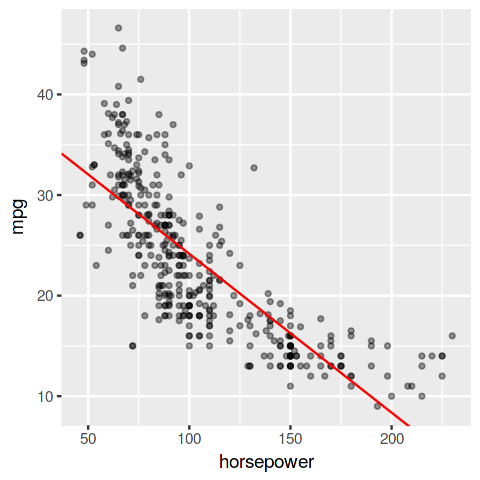

In [70]:
options(repr.plot.width = 4, repr.plot.height = 4)

ggplot(Auto, aes(horsepower, mpg)) + 
    geom_point(size = 1, alpha = 0.4) + 
    geom_abline(intercept = coef(lm.fit)[1], 
                slope = coef(lm.fit)[2],
                colour = "red")

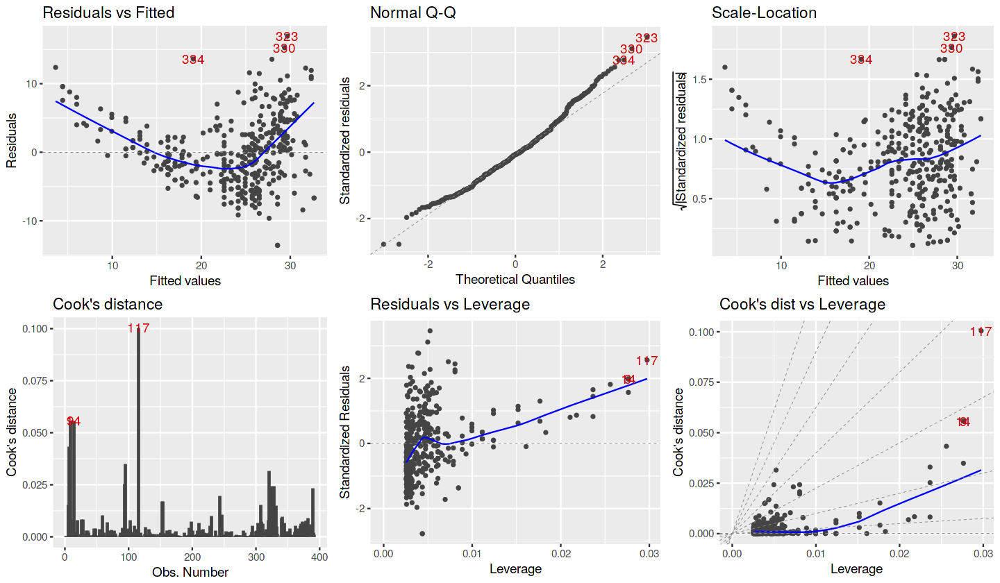

In [71]:
library("ggfortify")

options(repr.plot.width = 12, repr.plot.height = 7)

autoplot(lm.fit, which = 1:6, size = 1, label.colour = "#cc0000", ncol = 3)

- **Residuals × Fitted**: Evidence of a non-linear relationship
- **Normal Q–Q**: The Q–Q plot of the residuals shows that they are not normally distributed, otherwise would follow a straight line.
- **Scale–Location**: This plot is useful to check for homoscedasticity. In this case, the residuals show a heterocedasticity spread, because the are concentrated in some values and more spread in others.
- **Residuals × Leverage**: This plot helps find influential observations, which can be outliers. We might have two outliers, 94 and 117 — both shown by the Cook’s distance.

### Exercise 9

This question involves the use of multiple linear regression on the **Auto MPG** data set.

#### Exercise 9a

Produce a scatter plot matrix which includes all of the variables in the data set.

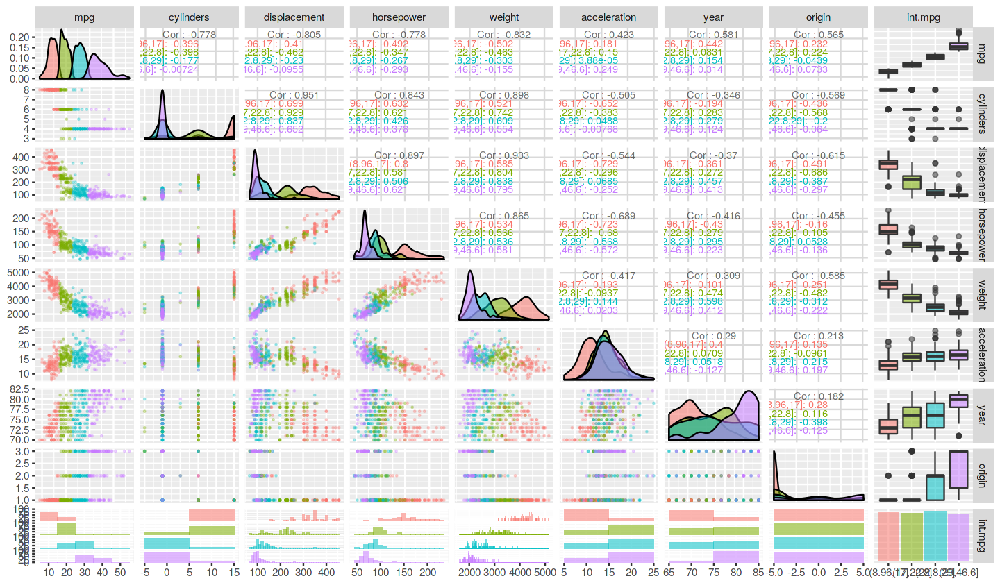

In [72]:
auto.no.name <- Auto[, which(colnames(Auto) != "name")]

auto.no.name$int.mpg <- quantileCut(auto.no.name$mpg, 4)

suppressWarnings(print(ggpairs(
    auto.no.name, 
    aes(alpha = 0.4, color = int.mpg),
    lower = list(
        combo = wrap("facethist", binwidth = 10), 
        continuous = wrap("points", alpha = 0.3, size = 0.3)), 
    upper = list(
        continuous = wrap("cor", size = 3)))))

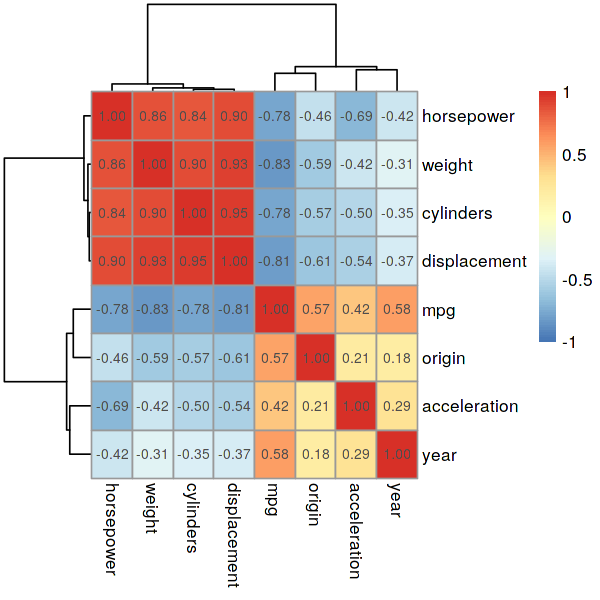

In [73]:
options(repr.plot.width = 5, repr.plot.height = 5)

pheatmap(cor(Auto[, which(names(Auto) != "name")], use="pairwise.complete.obs"), 
         display_numbers = TRUE,
         breaks = seq(-1, 1, 0.02))

#### Exercise 9c

Use the `lm()` function to perform a multiple linear regression with **mpg** as the response and all other variables except **name** as the predictors. Use the `summary()` function to print the results. Comment on the output.

In [74]:
lm.fit <- lm(mpg ~ . - name, data = Auto)
summary(lm.fit)


Call:
lm(formula = mpg ~ . - name, data = Auto)

Residuals:
    Min      1Q  Median      3Q     Max 
-9.5903 -2.1565 -0.1169  1.8690 13.0604 

Coefficients:
               Estimate Std. Error t value Pr(>|t|)    
(Intercept)  -17.218435   4.644294  -3.707  0.00024 ***
cylinders     -0.493376   0.323282  -1.526  0.12780    
displacement   0.019896   0.007515   2.647  0.00844 ** 
horsepower    -0.016951   0.013787  -1.230  0.21963    
weight        -0.006474   0.000652  -9.929  < 2e-16 ***
acceleration   0.080576   0.098845   0.815  0.41548    
year           0.750773   0.050973  14.729  < 2e-16 ***
origin         1.426141   0.278136   5.127 4.67e-07 ***
---
Signif. codes:  0 ‘***’ 0.001 ‘**’ 0.01 ‘*’ 0.05 ‘.’ 0.1 ‘ ’ 1

Residual standard error: 3.328 on 384 degrees of freedom
Multiple R-squared:  0.8215,	Adjusted R-squared:  0.8182 
F-statistic: 252.4 on 7 and 384 DF,  p-value: < 2.2e-16


1. Is there a relationship between the predictors and the response?

The $F$ is the ratio of two variances ($SSR/SSE$), the variance explained by the parameters in the model (sum of squares of regression, SSR) and the residual or unexplained variance (sum of squares of error, SSE). 

The F-statistic shown in the last row, and its respective p-value, is the statistic for the following null hypothesis:

$H_0: \beta_i , \forall i$, that is, all non-constant coefficients are zero

against the alternative hypothesis

$H_a:$ at least one of the non-constant coefficients is non-zero.

Thus, we may conclude there is at least one predictor related with the **mpg** measure.

2. Which predictors appear to have a statistically signiﬁcant relationship to the response?

Looking at the p-values, we can say that **weight**, **year**, **origin**, and **displacement** are the predictors with relationship.

3. What does the coeﬃcient for the year variable suggest?

The **year** coefficient suggests that the cars fuel efficiency increased by 0.75 mile per gallon per year — 0.75 mpg/year.

#### Exercise 9d

Use the `plot()` function to produce diagnostic plots of the linear regression ﬁt. Comment on any problems you see with the ﬁt.

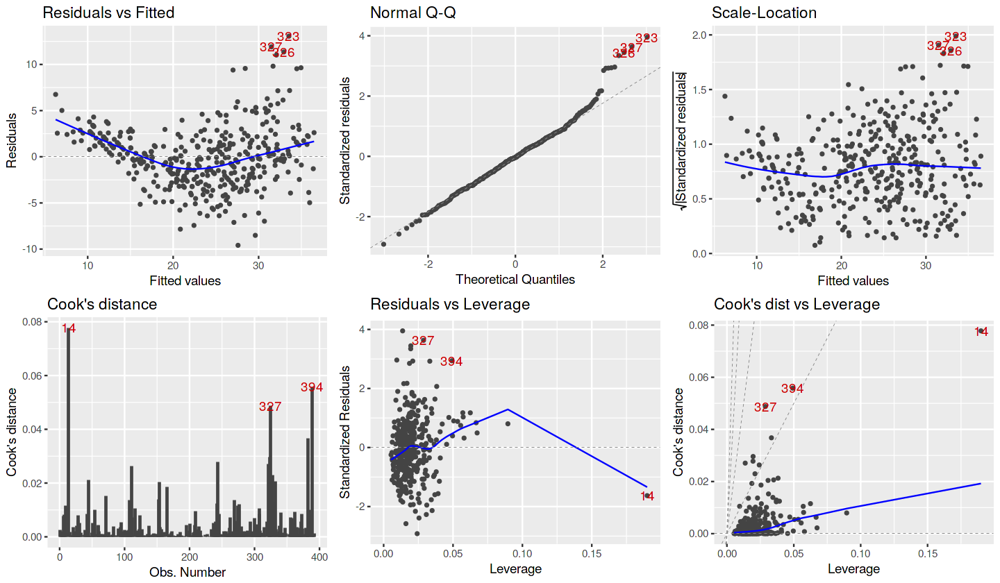

In [75]:
library("ggfortify")

options(repr.plot.width = 12, repr.plot.height = 7)

autoplot(lm.fit, which = 1:6, size = 1, label.colour = "#cc0000", ncol = 3)

- **Residuals × Fitted**: Evidence of a non-linear relationship
- **Normal Q–Q**: The Q–Q plot of the residuals shows that they are not normally distributed, otherwise would follow a straight line.
- **Scale–Location**: This plot is useful to check for homoscedasticity. In this case, the residuals show a heterocedasticity spread, because the are concentrated in some values and more spread in others.
- **Residuals × Leverage**: This plot helps find influential observations, which can be outliers. Particularly, the observation 14 seems to be an outlier.

Do the residual plots suggest any unusually large outliers? Does the leverage plot identify any observations with unusually high leverage?

There are three possible outliers — observations 14, 327, and 334:

In [76]:
Auto[c(14, 327, 334), ]

,mpg,cylinders,displacement,horsepower,weight,acceleration,year,origin,name
14,14.0,8,455,225,3086,10.0,70,1,buick estate wagon (sw)
329,30.0,4,146,67,3250,21.8,80,2,mercedes-benz 240d
338,32.4,4,107,72,2290,17.0,80,3,honda accord


I will remove the observation 14 for the rest of this exercise:

In [77]:
auto.clean <- auto[-c(14, 327, 334), ]

#### Exercise 9e

Use the `*` and `:` symbols to ﬁt linear regression models with interaction eﬀects. Do any interactions appear to be statistically signiﬁcant?

In [78]:
auto.no.name <- auto.clean[, which(names(Auto) != "name")]

lm.fit <- lm(mpg ~ .*., data = auto.no.name)
summary(lm.fit)


Call:
lm(formula = mpg ~ . * ., data = auto.no.name)

Residuals:
    Min      1Q  Median      3Q     Max 
-7.6786 -1.4665  0.0921  1.3038 11.1578 

Coefficients:
                            Estimate Std. Error t value Pr(>|t|)   
(Intercept)                3.605e+01  5.356e+01   0.673  0.50126   
cylinders                  6.820e+00  8.282e+00   0.824  0.41076   
displacement              -4.782e-01  1.900e-01  -2.517  0.01226 * 
horsepower                 4.864e-01  3.491e-01   1.393  0.16442   
weight                     5.381e-03  1.778e-02   0.303  0.76234   
acceleration              -5.952e+00  2.195e+00  -2.711  0.00702 **
year                       6.877e-01  6.146e-01   1.119  0.26390   
origin                    -2.084e+01  7.123e+00  -2.926  0.00365 **
cylinders:displacement    -2.751e-03  6.587e-03  -0.418  0.67650   
cylinders:horsepower       1.127e-02  2.451e-02   0.460  0.64603   
cylinders:weight           2.640e-04  9.561e-04   0.276  0.78256   
cylinders:acceleratio

The interactions **displacement:year**, **acceleration:year**, and **acceleration:origin** seems to be relevant.

In [79]:
lm.fit <- lm(mpg ~ . + displacement:year + acceleration:year + acceleration:origin, 
             data = Auto[, which(names(Auto) != "name")])
summary(lm.fit)


Call:
lm(formula = mpg ~ . + displacement:year + acceleration:year + 
    acceleration:origin, data = Auto[, which(names(Auto) != "name")])

Residuals:
    Min      1Q  Median      3Q     Max 
-7.7659 -1.8996  0.0241  1.4837 12.2739 

Coefficients:
                      Estimate Std. Error t value Pr(>|t|)    
(Intercept)         11.8757343 27.4715000   0.432   0.6658    
cylinders           -0.1269380  0.3026441  -0.419   0.6751    
displacement         0.1708125  0.0430357   3.969 8.62e-05 ***
horsepower          -0.0370510  0.0126847  -2.921   0.0037 ** 
weight              -0.0048741  0.0006195  -7.868 3.76e-14 ***
acceleration        -3.6459893  1.4303639  -2.549   0.0112 *  
year                 0.5476463  0.3561807   1.538   0.1250    
origin              -7.0940248  1.5825945  -4.483 9.77e-06 ***
displacement:year   -0.0022809  0.0005711  -3.994 7.81e-05 ***
acceleration:year    0.0374758  0.0186441   2.010   0.0451 *  
acceleration:origin  0.5078440  0.0957537   5.304 1.93e-0

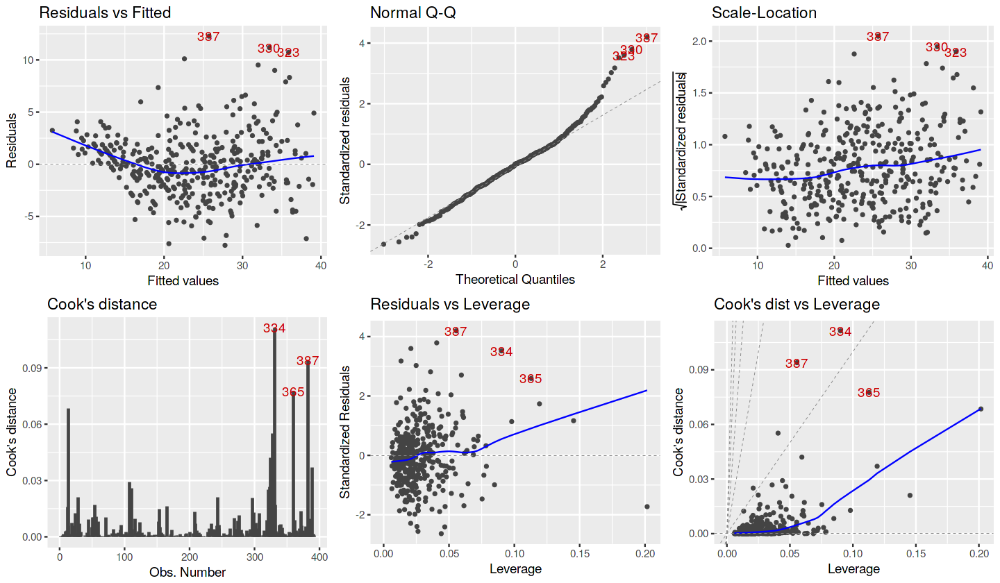

In [80]:
library("ggfortify")

options(repr.plot.width = 12, repr.plot.height = 7)

autoplot(lm.fit, which = 1:6, size = 1, label.colour = "#cc0000", ncol = 3)

#### Exercise 9f

Try a few diﬀerent transformations of the variables, such as $log(X)$, $\sqrt{X}$, $X^2$. Comment on your ﬁndings.

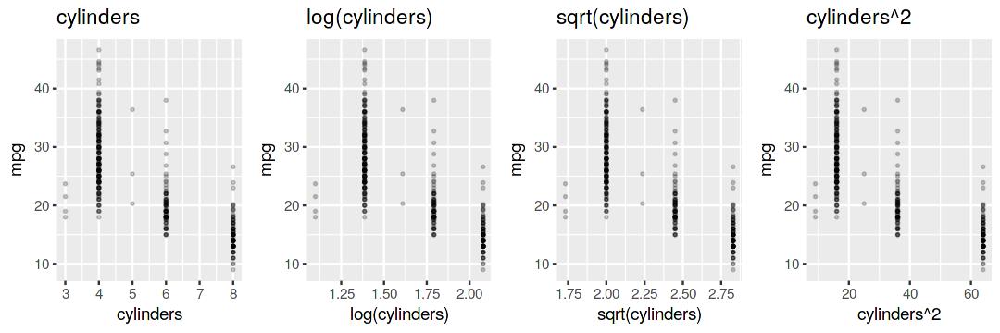

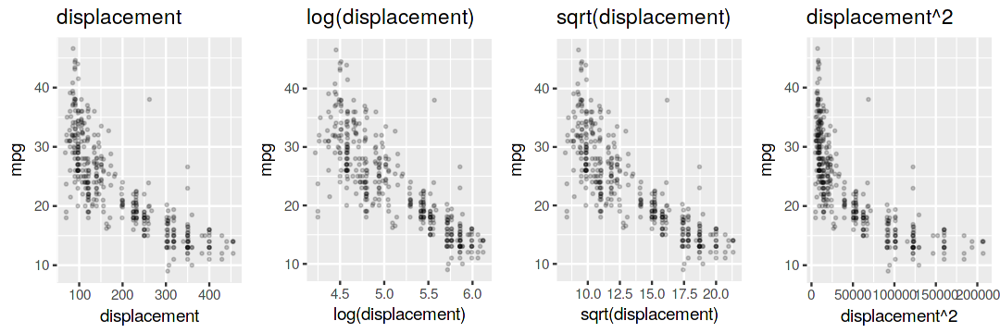

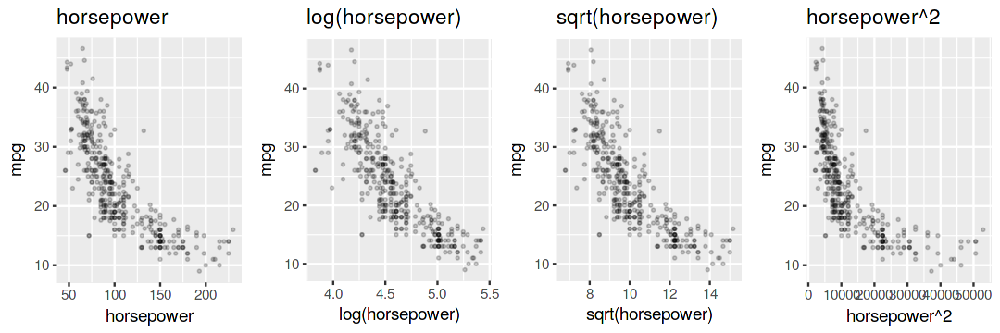

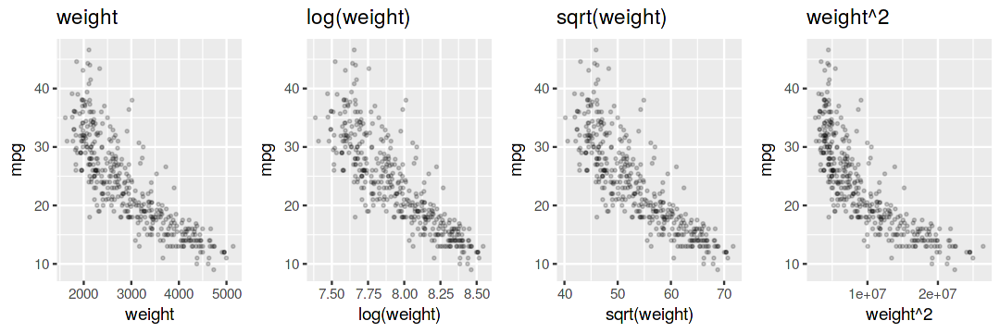

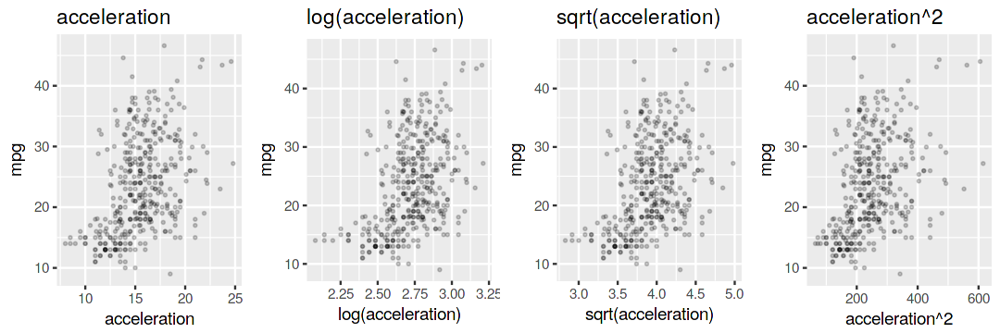

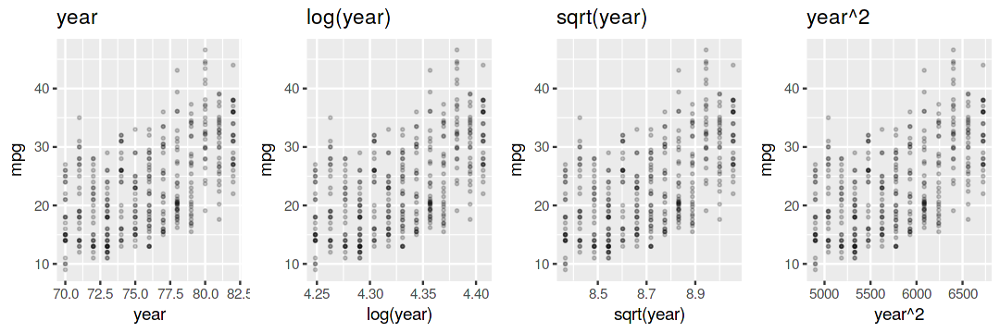

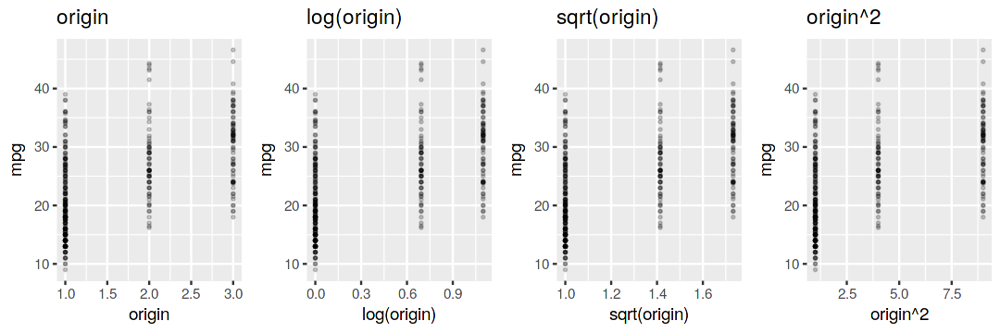

In [81]:
options(repr.plot.width = 9, repr.plot.height = 3)

auto.cols <- setdiff(names(Auto), c("name", "mpg"))

for (col in auto.cols) {
    transformations <- c(col, paste0("log(", col, ")"), 
                         paste0("sqrt(", col, ")"), paste0(col, "^2"))
    
    plots <- list()
    for (transf in transformations) {
        p <- ggplot(Auto, aes_string(transf, "mpg")) + 
               geom_point(size = 0.5, alpha = 0.2) + ggtitle(transf)
        plots <- c(plots, list(p))
    }
    
    do.call("grid.arrange", c(plots, ncol = 4))
}

**log(horsepower)** and **log(weight)** are good transformations.
Let’s remove **cylinders** from our model — we’ve seen it had not
statistical siginificante — and we will add these two new transformations.

In [82]:
lm.fit <- lm(mpg ~ . - cylinders + log(horsepower) + log(weight) +
             displacement:year + acceleration:year + acceleration:origin,
             data = auto.no.name)
summary(lm.fit)


Call:
lm(formula = mpg ~ . - cylinders + log(horsepower) + log(weight) + 
    displacement:year + acceleration:year + acceleration:origin, 
    data = auto.no.name)

Residuals:
    Min      1Q  Median      3Q     Max 
-8.4612 -1.4912 -0.0875  1.2430 12.0757 

Coefficients:
                      Estimate Std. Error t value Pr(>|t|)    
(Intercept)          2.904e+02  4.632e+01   6.268 1.00e-09 ***
displacement         5.325e-02  4.400e-02   1.210 0.226917    
horsepower           3.198e-02  3.064e-02   1.044 0.297372    
weight               4.917e-03  1.852e-03   2.655 0.008257 ** 
acceleration        -5.847e+00  1.358e+00  -4.306 2.13e-05 ***
year                -1.800e-01  3.418e-01  -0.527 0.598738    
origin              -3.678e+00  1.521e+00  -2.419 0.016037 *  
log(horsepower)     -8.820e+00  3.710e+00  -2.377 0.017938 *  
log(weight)         -2.782e+01  5.709e+00  -4.873 1.62e-06 ***
displacement:year   -8.125e-04  5.676e-04  -1.431 0.153152    
acceleration:year    6.957e-02  

Both transformations were good!

### Exercise 10

This question should be answered using the **Carseats** data set.

So this is a simulated data set containing sales of child car seats at 400 different stores, with 11 variables for each store.

**Variable** | **Description**
:- | :-
**Sales** | Unit sales (in thousands) at each location
**CompPrice** | Price charged by competitor at each location
**Income** | Community income level (in thousands of dollars)
**Advertising** | Local advertising budget for company at each location (in thousands of dollars)
**Population** | Population size in region (in thousands)
**Price** | Price company charges for car seats at each site
**ShelveLoc** | A factor with levels Bad, Good and Medium indicating the quality of the shelving location for the car seats at each site
**Age** | Average age of the local population
**Education** | Education level at each location
**Urban** | A factor with levels No and Yes to indicate whether the store is in an urban or rural location
**US** | A factor with levels No and Yes to indicate whether the store is in the US or not


In [83]:
head(Carseats)

Sales,CompPrice,Income,Advertising,Population,Price,ShelveLoc,Age,Education,Urban,US
9.50,138,73,11,276,120,Bad,42,17,Yes,Yes
11.22,111,48,16,260,83,Good,65,10,Yes,Yes
10.06,113,35,10,269,80,Medium,59,12,Yes,Yes
7.40,117,100,4,466,97,Medium,55,14,Yes,Yes
4.15,141,64,3,340,128,Bad,38,13,Yes,No
10.81,124,113,13,501,72,Bad,78,16,No,Yes


In [84]:
summary(Carseats$Price)

   Min. 1st Qu.  Median    Mean 3rd Qu.    Max. 
   24.0   100.0   117.0   115.8   131.0   191.0 

#### Exercise 10a

Fit a multiple regression model to predict **Sales** using **Price**, **Urban**, and **US**.

In [85]:
lm.fit <- lm(Sales ~ Price + Urban + US, data = Carseats)
summary(lm.fit)


Call:
lm(formula = Sales ~ Price + Urban + US, data = Carseats)

Residuals:
    Min      1Q  Median      3Q     Max 
-6.9206 -1.6220 -0.0564  1.5786  7.0581 

Coefficients:
             Estimate Std. Error t value Pr(>|t|)    
(Intercept) 13.043469   0.651012  20.036  < 2e-16 ***
Price       -0.054459   0.005242 -10.389  < 2e-16 ***
UrbanYes    -0.021916   0.271650  -0.081    0.936    
USYes        1.200573   0.259042   4.635 4.86e-06 ***
---
Signif. codes:  0 ‘***’ 0.001 ‘**’ 0.01 ‘*’ 0.05 ‘.’ 0.1 ‘ ’ 1

Residual standard error: 2.472 on 396 degrees of freedom
Multiple R-squared:  0.2393,	Adjusted R-squared:  0.2335 
F-statistic: 41.52 on 3 and 396 DF,  p-value: < 2.2e-16


#### Exercise 10b

Provide an interpretation of each coeﬃcient in the model. Be careful—some of the variables in the model are qualitative!

First of all, we see that the F-statistic is high and the p-value (last row)
is very low, giving us strong evidence to reject the null hypothesis that all
coefficients are zero. Thus, at least one of the non-constant coefficients 
are non-zero.

Note also that **UrbanYes** has a high p-value; we analyze it regardless this.

- We can say that outside the US, 13 thousand child car seats were sold, whereas in US about more 1200 units are sold.
- For **UrbanYes**, we could say in urban areas fewer units are sold than rural areas,by an average of 21 units.
- As for the price change, an increase of 1 unit of **Price** leads to a decrease of the sales by 54 units.

#### Exercise 10c

Write out the model in equation form, being careful to handle the qualitative variables properly.

$$ Sales = 13.043469 - 0.054459 \times Price - 0.021916 \times UrbanYes + 1.200573 \times USYes + \epsilon$$

#### Exercise 10d

For which of the predictors can you reject the null hypothesis 
$H_0 : \beta_j = 0$?

**Price** and **USYes**, which have p-values lower than 5%.

#### Exercise 10e

On the basis of your response to the previous question, ﬁt a smaller model that only uses the predictors for which there is evidence of association with the outcome.

In [86]:
lm.fit <- lm(Sales ~ Price + US, data = Carseats)
summary(lm.fit)


Call:
lm(formula = Sales ~ Price + US, data = Carseats)

Residuals:
    Min      1Q  Median      3Q     Max 
-6.9269 -1.6286 -0.0574  1.5766  7.0515 

Coefficients:
            Estimate Std. Error t value Pr(>|t|)    
(Intercept) 13.03079    0.63098  20.652  < 2e-16 ***
Price       -0.05448    0.00523 -10.416  < 2e-16 ***
USYes        1.19964    0.25846   4.641 4.71e-06 ***
---
Signif. codes:  0 ‘***’ 0.001 ‘**’ 0.01 ‘*’ 0.05 ‘.’ 0.1 ‘ ’ 1

Residual standard error: 2.469 on 397 degrees of freedom
Multiple R-squared:  0.2393,	Adjusted R-squared:  0.2354 
F-statistic: 62.43 on 2 and 397 DF,  p-value: < 2.2e-16


#### Exercise 10f

How well do the models in (10a) and (10e) ﬁt the data?

Concerning the last model
- Adjusted R-squared has increased slightly (23.35% ⇒ 23.54%)
- F-statistic has increased (41.52 ⇒ 62.43)
- All predictors are relevant now

#### Exercise 10g

Using the model from (10e), obtain 95% conﬁdence intervals for the coeﬃcients.

In [87]:
confint(lm.fit)

,2.5 %,97.5 %
(Intercept),11.79032020,14.27126531
Price,-0.06475984,-0.04419543
USYes,0.69151957,1.70776632


#### Exercise 10h

Is there evidence of outliers or high leverage observations in the model from (10e)?

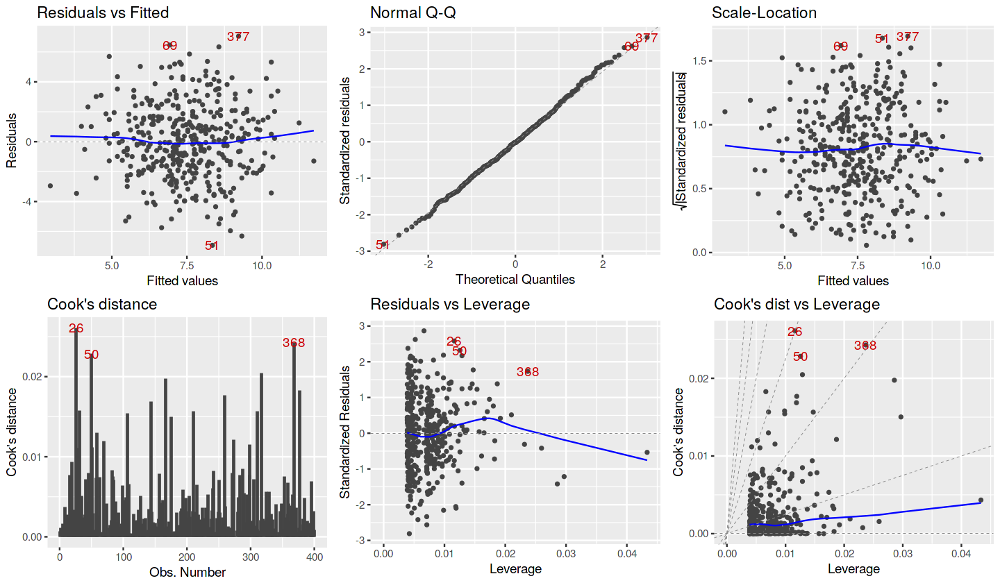

In [88]:
library("ggfortify")

options(repr.plot.width = 12, repr.plot.height = 7)

autoplot(lm.fit, which = 1:6, size = 1, label.colour = "#cc0000", ncol = 3)

All values appear to be bounded in the range (-3, +3), which seem to indicate
no presence of outliers.

### Exercise 11

In this problem we will investigate the t-statistic for the null hypothesis $H_0 : \beta = 0$ in simple linear regression without an intercept. To begin, we generate a predictor **x** and a response **y** as follows.

In [89]:
set.seed(1)
x <- rnorm(100)
y <- 2 * x + rnorm(100)

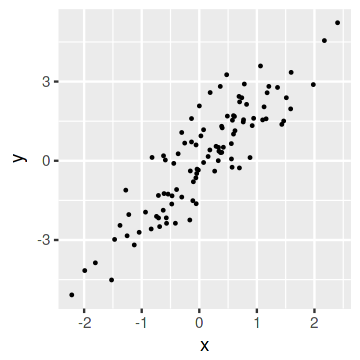

In [90]:
options(repr.plot.width = 3, repr.plot.height = 3)

ggplot(data.frame(x = x, y = y), aes(x, y)) + geom_point(size = 0.3)

#### Exercise 11a

Perform a simple linear regression of **y** onto **x**, without an intercept. Report the coeﬃcient estimate $\beta$, the standard error of this coeﬃcient estimate, and the t-statistic and p-value associated with the null hypothesis $H_0 : \beta = 0$. Comment on these results. (You can perform regression without an intercept using the command `lm(y ∼ x + 0)`.)

In [91]:
lm.fit <- lm(y ~ x - 1)
summary(lm.fit)


Call:
lm(formula = y ~ x - 1)

Residuals:
    Min      1Q  Median      3Q     Max 
-1.9154 -0.6472 -0.1771  0.5056  2.3109 

Coefficients:
  Estimate Std. Error t value Pr(>|t|)    
x   1.9939     0.1065   18.73   <2e-16 ***
---
Signif. codes:  0 ‘***’ 0.001 ‘**’ 0.01 ‘*’ 0.05 ‘.’ 0.1 ‘ ’ 1

Residual standard error: 0.9586 on 99 degrees of freedom
Multiple R-squared:  0.7798,	Adjusted R-squared:  0.7776 
F-statistic: 350.7 on 1 and 99 DF,  p-value: < 2.2e-16


Since we know the actual function $f(x)$, we can see that the $\beta$ coefficient 1.9939
got close of the real coefficient 2.  By looking at the coefficient interval:

In [92]:
confint(lm.fit)

,2.5 %,97.5 %
x,1.782603,2.205149


We can note that the interval is very large even though the coefficient estimate
is very close to the actual.

Finally, we can see the p-value associated with the null hypothesis $H_0 : \beta$ 
is sufficiently low so we can reject the null hypothesis.

#### Exercise 11b

Now perform a simple linear regression of **x** onto **y** without an intercept, and report the coeﬃcient estimate, its standard error, and the corresponding t-statistic and p-values associated with the null hypothesis $H_0 : \beta = 0$. Comment on these results.

In [93]:
lm.fit <- lm(x ~ y - 1)
summary(lm.fit)


Call:
lm(formula = x ~ y - 1)

Residuals:
    Min      1Q  Median      3Q     Max 
-0.8699 -0.2368  0.1030  0.2858  0.8938 

Coefficients:
  Estimate Std. Error t value Pr(>|t|)    
y  0.39111    0.02089   18.73   <2e-16 ***
---
Signif. codes:  0 ‘***’ 0.001 ‘**’ 0.01 ‘*’ 0.05 ‘.’ 0.1 ‘ ’ 1

Residual standard error: 0.4246 on 99 degrees of freedom
Multiple R-squared:  0.7798,	Adjusted R-squared:  0.7776 
F-statistic: 350.7 on 1 and 99 DF,  p-value: < 2.2e-16


We also know the actual function here, $x = \frac{1}{2} (y - \epsilon)$.  Our coefficient estimate is
0.39. Let’s check the coefficient interval:

In [94]:
confint(lm.fit)

,2.5 %,97.5 %
y,0.3496717,0.4325574


I expected that the coefficient interval would include the actual $\beta = 0.5$. 
However, this coefficient interval does not.

#### Exercise 11c

What is the relationship between the results obtained in (11a) and (11b)?

In (11a) we approximated $y = 2x + \epsilon$, whereas in (11b) we approximated
the inverse function, $x = \frac{1}{2} (y - \epsilon)$.

Both (11a) and (11b) have the same $R^2$, F-statistic and its p-value.

#### Exercise 11d

For the regression of **y** onto **x** without an intercept, the t-statistic for 
$H_0 : \beta = 0$ takes the form $\frac{\hat\beta}{SE(\hat\beta)}$, where
$$
\hat\beta = 
    \frac{
        \sum_{i = 1}^{n} x_i y_i
    }{
        \sum_{i' = 1}^{n} x_{i'}^{2}
    },
$$
and
$$ 
SE(\hat\beta) = \sqrt{ 
    \frac{
        \sum_{i = 1}^{n} \left( y_i - x_i \hat\beta \right)^2
    }{
        \left( n - 1 \right) \sum_{i' = 1}^{n} x_{i'}^{2}
    }
}.
$$
(These formulas are slightly diﬀerent from those given in Sections 3.1.1 and 3.1.2, since here we are performing regression without an intercept.) Show algebraically, and conﬁrm numerically in R, that the t-statistic can be written as
$$
\frac{
    \left( \sqrt{n - 1} \right) \sum_{i = 1}^{n} x_i y_i
}{
    \sqrt{
        \left( \sum_{i = 1}^{n} x_i^2 \right)
        \left( \sum_{i' = 1}^{n} y_{i'}^{2} \right)
        \left( \sum_{i' = 1}^{n} x_{i'} y_{i'} \right)^2
    }
}.
$$

$$
t = 
\frac{
    % beta estimate
    \frac{
        \sum_{i = 1}^{n} x_i y_i
    }{
        \sum_{i' = 1}^{n} x_{i'}^{2}
    }
}{
    % Standard Error
    \sqrt{ 
        \frac{
            \sum_{i = 1}^{n} \left( y_i - x_i \hat\beta \right)^2
        }{
            \left( n - 1 \right) \sum_{i' = 1}^{n} x_{i'}^{2}
        }
    }    
}
$$

$$
= 
% beta estimate
\frac{
    \left(
        \sum_{i = 1}^{n} x_i y_i
    \right)
}{
    \left(
        \sum_{i' = 1}^{n} x_{i'}^{2}
    \right)
}
\cdot
% Standard Error
\sqrt{ 
    \frac{
        \left( n - 1 \right) \sum_{i' = 1}^{n} x_{i'}^{2}
    }{
        \sum_{i = 1}^{n} \left( y_i - x_i \hat\beta \right)^2
    }
}    
$$

$$
= 
\frac{
    \left( \sum_{i = 1}^{n} x_i y_i \right)
    \sqrt{ n - 1 }
    \left( \sum_{i' = 1}^{n} x_{i'}^{2} \right)^{\frac{1}{2}}
    \left( \sum_{i' = 1}^{n} x_{i'}^{2} \right)^{-1}
}{
    \sqrt{ \sum_{i = 1}^{n} \left( y_i - x_i \hat\beta \right)^2 }
}
$$

$$
= 
\frac{
    \sqrt{ n - 1 }
    \left( \sum_{i = 1}^{n} x_i y_i \right)
}{
    \sqrt{ \sum_{i' = 1}^{n} x_{i'}^{2} \sum_{i = 1}^{n} \left( y_i - x_i \hat\beta \right)^2 }
}
$$

$$
= 
\frac{
    \sqrt{ n - 1 }
    \left( \sum_{i = 1}^{n} x_i y_i \right)
}{
    \sqrt{ 
        \sum_{i' = 1}^{n} x_{i'}^{2} 
        \sum_{i = 1}^{n} \left( y_i - 2 x_i y_i \hat\beta + x_i^2 \hat\beta^2 \right)
    }
}
$$

$$
= 
\frac{
    \sqrt{ n - 1 }
    \left( \sum_{i = 1}^{n} x_i y_i \right)
}{
    \sqrt{ 
        \sum_{i' = 1}^{n} x_{i'}^{2} 
        \sum_{i = 1}^{n} y_i^2 - 
        \sum_{i' = 1}^{n} x_{i'}^{2} \sum_{i = 1}^{n} \left( 2 x_i y_i \hat\beta + x_i^2 \hat\beta^2 \right)
    }
}
$$

$$
= 
\frac{
    \sqrt{ n - 1 }
    \left( \sum_{i = 1}^{n} x_i y_i \right)
}{
    \sqrt{ 
        \sum_{i' = 1}^{n} x_{i'}^{2} 
        \sum_{i = 1}^{n} y_i^2 - 
        \sum_{i' = 1}^{n} x_{i'}^{2} 2 \hat\beta 
        \sum_{i = 1}^{n} \left( x_i y_i + x_i^2 \hat\beta \right)
    }
}
$$

$$
= 
\frac{
    \sqrt{ n - 1 }
    \left( \sum_{i = 1}^{n} x_i y_i \right)
}{
    \sqrt{ 
        \sum_{i' = 1}^{n} x_{i'}^{2} 
        \sum_{i = 1}^{n} y_i^2 - 
        \sum_{i' = 1}^{n} x_{i'}^{2} 2 
            \frac{
                \left(
                    \sum_{i = 1}^{n} x_i y_i
                \right)
            }{
                \left(
                    \sum_{i' = 1}^{n} x_{i'}^{2}
                \right)
            }        
        \sum_{i = 1}^{n} 
        \left( 
            x_i y_i + x_i^2 
            \frac{
                \left(
                    \sum_{i = 1}^{n} x_i y_i
                \right)
            }{
                \left(
                    \sum_{i' = 1}^{n} x_{i'}^{2}
                \right)
            }            
        \right)
    }
}
$$

$$
= 
\frac{
    \sqrt{ n - 1 }
    \left( \sum_{i = 1}^{n} x_i y_i \right)
}{
    \sqrt{ 
        \sum_{i' = 1}^{n} x_{i'}^{2} 
        \sum_{i = 1}^{n} y_i^2 - 
        \left( \sum_{i = 1}^{n} x_i y_i \right)
        \left(
            2 
            \sum_{i = 1}^{n} x_i y_i - 
            \sum_{i = 1}^{n} x_i y_i
        \right)
    }
}
$$

$$
= 
\frac{
    \sqrt{ n - 1 }
    \left( \sum_{i = 1}^{n} x_i y_i \right)
}{
    \sqrt{ 
        \sum_{i' = 1}^{n} x_{i'}^{2} 
        \sum_{i = 1}^{n} y_i^2 - 
        \left( \sum_{i = 1}^{n} x_i y_i \right)^2
    }
}.
$$

Let’s confirm this result numerically.  In the output of the last call to
`summary(lm.fit)` we see that the t-statistic for $\hat\beta = 18.73$.
This formula should result in the same t-statistic.

In [95]:
t.statistic <- function(x, y) {
    n <- length(x)
    numerator <- sqrt(n - 1) * sum(x * y)
    denominator <- sqrt(sum(x ** 2) * sum(y ** 2) - sum(x * y) ** 2)
    numerator / denominator
}

t.statistic(x, y)

[1] 18.72593

#### Exercise 11e

Using the results from (11d), argue that the t-statistic for the regression of **y** onto **x** is the same as the t-statistic for the regression of **x** onto **y**.

If we swap **x** and **y** values, the t-statistic will be the same:

In [96]:
t.statistic(y, x)

[1] 18.72593

#### Exercise 11f

In `R`, show that when regression is performed with an intercept, the t-statistic for 
$H_0 : \beta_1 = 0$ is the same for the regression of **y** onto **x** as it is for the 
regression of **x** onto **y**.

In [97]:
lm.fit.y.onto.x <- lm(y ~ x)
lm.fit.x.onto.y <- lm(x ~ y)

display_markdown("**y** onto **x**")
summary(lm.fit.y.onto.x)$coefficients

display_markdown("**x** onto **y**")
summary(lm.fit.x.onto.y)$coefficients

**y** onto **x**

,Estimate,Std. Error,t value,Pr(>|t|)
(Intercept),-0.03769261,0.09698729,-0.3886346,6.983896e-01
x,1.99893961,0.10772703,18.5555993,7.723851e-34


**x** onto **y**

,Estimate,Std. Error,t value,Pr(>|t|)
(Intercept),0.03880394,0.04266144,0.9095787,3.652764e-01
y,0.38942451,0.02098690,18.5555993,7.723851e-34


The t-statistic of $\beta_1$ is 18.5 for both regressions.

### Exercise 12

This problem involves simple linear regression without an intercept.

#### Exercise 12a

Recall that the coeﬃcient estimate $\hat\beta$ for the linear regression of **y** onto **x** without an intercept is given by
$$
\hat\beta = 
    \frac{
        \sum_{i = 1}^{n} x_i y_i
    }{
        \sum_{i' = 1}^{n} x_{i'}^{2}
    }.
$$
Under what circumstance is the coeﬃcient estimate for the regression of **x** onto **y** the same as the coeﬃcient estimate for the regression of **y** onto **x**?

For a linear regression of **y** onto **x** we have
$$
\hat\beta = 
    \frac{
        \sum_{i = 1}^{n} x_i y_i
    }{
        \sum_{i' = 1}^{n} x_{i'}^{2}
    },
$$
whereas for a linear regression of **x** onto **y** we have
$$
\hat\beta = 
    \frac{
        \sum_{i = 1}^{n} x_i y_i
    }{
        \sum_{i' = 1}^{n} y_{i'}^{2}
    }.
$$
Hence, the coefficient estimate is the same when 
$\sum_{i' = 1}^{n} x_{i'}^{2} = \sum_{i' = 1}^{n} y_{i'}^{2}$.

#### Exercise 12b

Generate an example in `R` with $n = 100$ observations in which the coeﬃcient estimate for the regression of **x** onto **y** is *diﬀerent from* the coeﬃcient estimate for the regression of **y** onto **x**.

In [98]:
compare.lm <- function(x, y) {
    a <- lm(y ~ x)
    b <- lm(x ~ y)
    cat(paste("Squared sums:", round(c(sum(x^2), sum(y^2)), digits = 2)), "\n")
    cat("y ~ x\n")
    print(coef(a))
    cat("x ~ y\n")
    print(coef(b))
}

set.seed(1)
x <- rnorm(100)
y <- 2 * x + rnorm(100, sd = 0.005)

compare.lm(x, y)

Squared sums: 81.06 Squared sums: 324.21 
y ~ x
  (Intercept)             x 
-0.0001884631  1.9999946981 
x ~ y
 (Intercept)            y 
0.0000950051 0.4999977714 


#### Exercise 12c

Generate an example in `R` with $n = 100$ observations in which the coeﬃcient estimate for the regression of **x** onto **y** is *the same as* the coeﬃcient estimate for the regression of **y** onto **x**.

In [99]:
set.seed(1)
x <- rnorm(100)
y <- -x + rnorm(100, sd = 0.006)

compare.lm(x, y)

Squared sums: 81.06 Squared sums: 81.06 
y ~ x
  (Intercept)             x 
-0.0002261557 -1.0000063623 
x ~ y
  (Intercept)             y 
-0.0002216871 -0.9999526973 


I added some irreducible error, but the coefficient are quite close.

### Exercise 13

In this exercise you will create some simulated data and will ﬁt simple linear regression models to it. Make sure to use `set.seed(1)` prior to starting part (13a) to ensure consistent results.

#### Exercise 13a

Using the `rnorm()` function, create a vector, **x**, containing 100 observations drawn from a $N(0, 1)$ distribution. This represents a feature, **x**.

In [100]:
set.seed(1)
x <- rnorm(100)

#### Exercise 13b

Using the `rnorm()` function, create a vector, **eps**, containing 100 observations drawn from a $N(0, 0.25)$ distribution i.e. a normal distribution with mean zero and variance 0.25.

In [101]:
eps <- rnorm(100, sd = 0.25)

#### Exercise 13c

Using **x** and **eps**, generate a vector **y** according to the model
$y = -1 + 0.5 x + \epsilon$.
What is the length of the vector **y**? What are the values of 
$\beta_0$ and $\beta_1$ in this linear model?

In [102]:
y <- -1 + 0.5 * x + eps
lm.fit <- lm(y ~ x)
coef(lm.fit)

(Intercept)           x 
 -1.0094232   0.4997349

**y** has a length of 100, the same of **y** and **eps**.

#### Exercise 13d

Create a scatter plot displaying the relationship between **x** and **y**. Comment on what you observe.

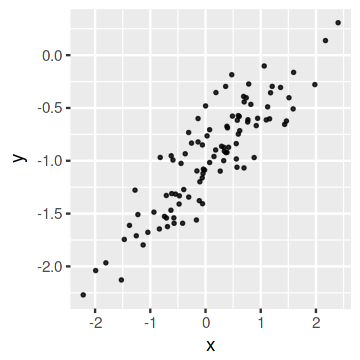

In [103]:
ggplot(data.frame(x, y), aes(x, y)) + geom_point(size = 0.5, alpha = 0.8)

It is a linear relationship, with **x** positively correlated with **y**.

#### Exercise 13e

Fit a least squares linear model to predict **y** using **x**. Comment on the model obtained. 
How do $\hat\beta_0$ and $\hat\beta_1$ compare to $\beta_0$ and $\beta-1$?

In [104]:
lm.fit <- lm(y ~ x)
summary(lm.fit)


Call:
lm(formula = y ~ x)

Residuals:
     Min       1Q   Median       3Q      Max 
-0.46921 -0.15344 -0.03487  0.13485  0.58654 

Coefficients:
            Estimate Std. Error t value Pr(>|t|)    
(Intercept) -1.00942    0.02425  -41.63   <2e-16 ***
x            0.49973    0.02693   18.56   <2e-16 ***
---
Signif. codes:  0 ‘***’ 0.001 ‘**’ 0.01 ‘*’ 0.05 ‘.’ 0.1 ‘ ’ 1

Residual standard error: 0.2407 on 98 degrees of freedom
Multiple R-squared:  0.7784,	Adjusted R-squared:  0.7762 
F-statistic: 344.3 on 1 and 98 DF,  p-value: < 2.2e-16


The adjusted $R^2$ of 77.62 is good, with a F-statistic high and a very low p-value, indicating strong relationship between **x** and **y** — we can reject the null hypothesis $H_0 : \beta_i = 0$ for $i = 0, 1$. The scatter plot already landed evidence for that, this is yet another evidence.  Both coefficients are significant.

We know the actual function, $y = -1 + 0.5 x + \epsilon$, where
$$
    \beta_0 = -1,
$$
$$
    \beta_1 = 0.5.
$$
The obtained coefficients are $\hat\beta = -1.01$ and $\hat\beta_1 = 0.5$, which are very close to the real ones.

#### Exercise 13f

Display the least squares line on the scatter plot obtained in (13d). Draw the population regression line on the plot, in a diﬀerent color. Use the `legend()` command to create an appropriate legend.

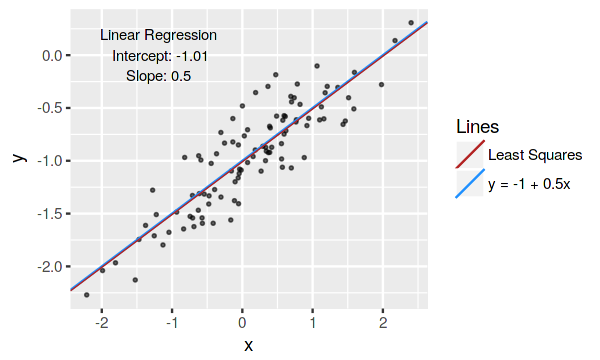

In [105]:
options(repr.plot.width = 5, repr.plot.height = 3)

line.spec <- paste("Linear Regression\n", paste(
    c("Intercept", "Slope"), 
    round(coef(lm.fit), digits = 2), 
    sep = ": ", 
    collapse = "\n"))

ggplot(data.frame(x, y), aes(x, y)) + 
    geom_point(size = 0.5, alpha = 0.6) + 
    geom_abline(
        aes(intercept = -1, 
            slope = 0.5, 
            color = "y = -1 + 0.5x"), 
        show.legend = TRUE) + 
    geom_abline(
        aes(intercept = coef(lm.fit)[1], 
            slope = coef(lm.fit)[2], 
            color = "Least Squares"), 
        size = 0.3,
        show.legend = TRUE) + 
    scale_colour_manual(values = c("firebrick", "dodgerblue")) +
    geom_text(
        data = data.frame(x = -1.2, y = 0), 
        map = aes(x = x, y = y), 
        label = line.spec,
        size = 3) +
    guides(colour = guide_legend(title = "Lines"))

#### Exercise 13g

Now ﬁt a polynomial regression model that predicts **y** using **x** and **x²**. 
Is there evidence that the quadratic term improves the model ﬁt? Explain your answer.

In [106]:
lm.fit <- lm(y ~ poly(x, 2))
summary(lm.fit)


Call:
lm(formula = y ~ poly(x, 2))

Residuals:
    Min      1Q  Median      3Q     Max 
-0.4913 -0.1563 -0.0322  0.1451  0.5675 

Coefficients:
            Estimate Std. Error t value Pr(>|t|)    
(Intercept) -0.95501    0.02395 -39.874   <2e-16 ***
poly(x, 2)1  4.46612    0.23951  18.647   <2e-16 ***
poly(x, 2)2 -0.33602    0.23951  -1.403    0.164    
---
Signif. codes:  0 ‘***’ 0.001 ‘**’ 0.01 ‘*’ 0.05 ‘.’ 0.1 ‘ ’ 1

Residual standard error: 0.2395 on 97 degrees of freedom
Multiple R-squared:  0.7828,	Adjusted R-squared:  0.7784 
F-statistic: 174.8 on 2 and 97 DF,  p-value: < 2.2e-16


There is no evidence that **x²** improves the model, because the p-value of 0.164 
is too high, so we cannot reject the null hypothesis $H_0 : \beta_1 = 0$.

#### Exercise 13h

Repeat (13a)–(13f) after modifying the data generation process in such a way that there is *less* noise in the data. The model (3.39) should remain the same. You can do this by decreasing the variance of the normal distribution used to generate the error term $\epsilon$ in (13b). Describe your results.

In [107]:
set.seed(1)
x <- rnorm(100)
eps <- rnorm(100, sd = 0.12)
y <- -1 + 0.5 * x + eps
lm.fit <- lm(y ~ x)
coef(lm.fit)

(Intercept)           x 
 -1.0045231   0.4998728

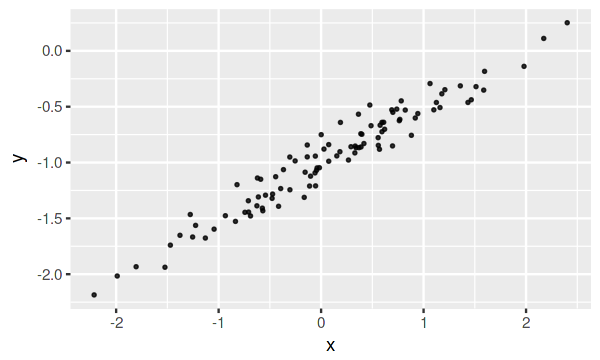

In [108]:
ggplot(data.frame(x, y), aes(x, y)) + geom_point(size = 0.5, alpha = 0.8)

We reduced the variance of the data.

In [109]:
lm.fit <- lm(y ~ x)
summary(lm.fit)


Call:
lm(formula = y ~ x)

Residuals:
     Min       1Q   Median       3Q      Max 
-0.22522 -0.07365 -0.01674  0.06473  0.28154 

Coefficients:
            Estimate Std. Error t value Pr(>|t|)    
(Intercept) -1.00452    0.01164  -86.31   <2e-16 ***
x            0.49987    0.01293   38.67   <2e-16 ***
---
Signif. codes:  0 ‘***’ 0.001 ‘**’ 0.01 ‘*’ 0.05 ‘.’ 0.1 ‘ ’ 1

Residual standard error: 0.1155 on 98 degrees of freedom
Multiple R-squared:  0.9385,	Adjusted R-squared:  0.9379 
F-statistic:  1495 on 1 and 98 DF,  p-value: < 2.2e-16


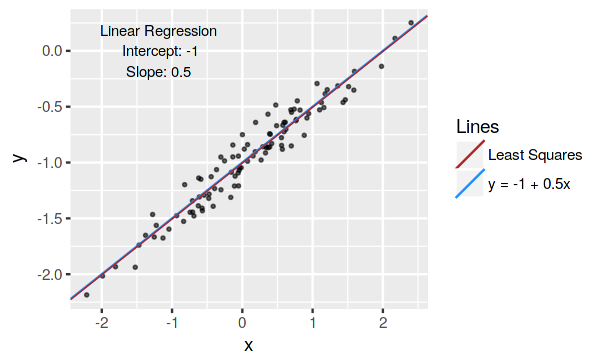

In [110]:
options(repr.plot.width = 5, repr.plot.height = 3)

line.spec <- paste("Linear Regression\n", paste(
    c("Intercept", "Slope"), 
    round(coef(lm.fit), digits = 2), 
    sep = ": ", 
    collapse = "\n"))

ggplot(data.frame(x, y), aes(x, y)) + 
    geom_point(size = 0.5, alpha = 0.6) + 
    geom_abline(
        aes(intercept = -1, 
            slope = 0.5, 
            color = "y = -1 + 0.5x"), 
        show.legend = TRUE) + 
    geom_abline(
        aes(intercept = coef(lm.fit)[1], 
            slope = coef(lm.fit)[2], 
            color = "Least Squares"),
        size = 0.3, 
        show.legend = TRUE) + 
    scale_colour_manual(values = c("firebrick", "dodgerblue")) +
    geom_text(
        data = data.frame(x = -1.2, y = 0), 
        map = aes(x = x, y = y), 
        label = line.spec,
        size = 3) +
    guides(colour = guide_legend(title = "Lines"))

The adjusted $R²$ has increased from 77.62% to 93.79%, and a decrease of the MSE from 0.2395 to 0.115, quite close from the reduction of the irreducible $\epsilon$, that we decreased from 0.25 to 0.11 — 0.2395 / 0.115 = *2.0826* and 0.25 / 11 = *2.0833*.

The coefficient themselves are still pretty close to the real $\beta$s, as we can see in the plot above the two lines are very close to one another.

#### Exercise 13g

Repeat (13a)–(13f) after modifying the data generation process in such a way that there is *more* noise in the data. The model (3.39) should remain the same. You can do this by increasing the variance of the normal distribution used to generate the error term $\epsilon$ in (13b). Describe your results.

In [111]:
set.seed(1)
x <- rnorm(100)
eps <- rnorm(100, sd = 1)
y <- -1 + 0.5 * x + eps
lm.fit <- lm(y ~ x)
coef(lm.fit)

(Intercept)           x 
 -1.0376926   0.4989396

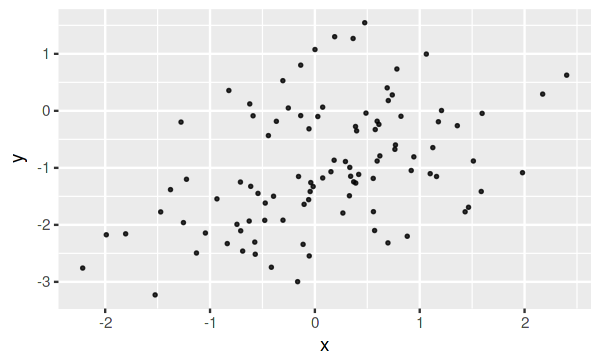

In [112]:
ggplot(data.frame(x, y), aes(x, y)) + geom_point(size = 0.5, alpha = 0.8)

This time we’ve double the standard error from where the irreducible error
is drawn.

In [113]:
lm.fit <- lm(y ~ x)
summary(lm.fit)


Call:
lm(formula = y ~ x)

Residuals:
    Min      1Q  Median      3Q     Max 
-1.8768 -0.6138 -0.1395  0.5394  2.3462 

Coefficients:
            Estimate Std. Error t value Pr(>|t|)    
(Intercept) -1.03769    0.09699 -10.699  < 2e-16 ***
x            0.49894    0.10773   4.632 1.12e-05 ***
---
Signif. codes:  0 ‘***’ 0.001 ‘**’ 0.01 ‘*’ 0.05 ‘.’ 0.1 ‘ ’ 1

Residual standard error: 0.9628 on 98 degrees of freedom
Multiple R-squared:  0.1796,	Adjusted R-squared:  0.1712 
F-statistic: 21.45 on 1 and 98 DF,  p-value: 1.117e-05


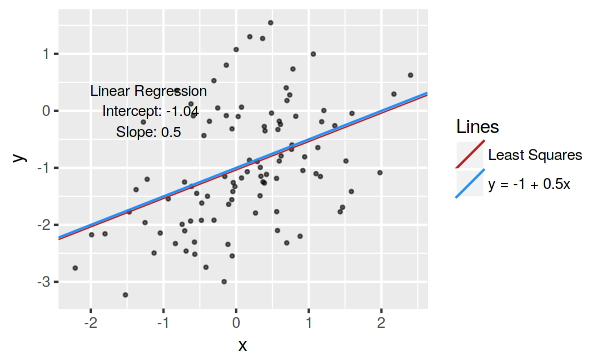

In [114]:
options(repr.plot.width = 5, repr.plot.height = 3)

line.spec <- paste("Linear Regression\n", paste(
    c("Intercept", "Slope"), 
    round(coef(lm.fit), digits = 2), 
    sep = ": ", 
    collapse = "\n"))

ggplot(data.frame(x, y), aes(x, y)) + 
    geom_point(size = 0.5, alpha = 0.6) + 
    geom_abline(
        aes(intercept = -1, 
            slope = 0.5, 
            color = "y = -1 + 0.5x"), 
        show.legend = TRUE) + 
    geom_abline(
        aes(intercept = coef(lm.fit)[1], 
            slope = coef(lm.fit)[2], 
            color = "Least Squares"), 
        size = 0.3,
        show.legend = TRUE) + 
    scale_colour_manual(values = c("firebrick", "dodgerblue")) +
    geom_text(
        data = data.frame(x = -1.2, y = 0), 
        map = aes(x = x, y = y), 
        label = line.spec,
        size = 3) +
    guides(colour = guide_legend(title = "Lines"))

The MSE is twice as high as the MSE of the first model, 0.4814 / 0.2407 = 2,
following the amount of variance we have increased.

The adjusted $R^2$ decreased from 77.62% to 46.19%.
When we reduced the error by half, the $R^2$ had increased 16.17 percentage points (pp). 
This time we doubled it and the $R^2$ decreased 31.43 pp.

The $\hat\beta$s are slightly different, and the plot above shows the two lines slightly more separate.

#### Exercise 13j

What are the conﬁdence intervals for $\beta_0$ and $\beta_1$ based on the original data set, the noisier data set, and the less noisy data set? Comment on your results.

In [115]:
confint.dataset <- function(sd) {
    set.seed(1)
    x <- rnorm(100)
    eps <- rnorm(100, sd = sd)
    y <- -1 + 0.5 * x + eps
    model <- lm(y ~ x)
    cat("sd =", sd, "\n")
    confint(model)
}

confint.dataset(0.25)
confint.dataset(0.5)
confint.dataset(0.12)

sd = 0.25 


,2.5 %,97.5 %
(Intercept),-1.0575402,-0.9613061
x,0.4462897,0.5531801


sd = 0.5 


,2.5 %,97.5 %
(Intercept),-1.1150804,-0.9226122
x,0.3925794,0.6063602


sd = 0.12 


,2.5 %,97.5 %
(Intercept),-1.0276193,-0.9814269
x,0.4742191,0.5255264


The confidence intervals of the coefficients increase together with the  
irreducible error $\epsilon$ we add to the data.  This means the less noise
we have on the data, the more tight the confidence intervals become.

### Exercise 14

This problem focuses on the collinearity problem.

In [116]:
set.seed(1)
x1 <- runif(100)
x2 <- 0.5 * x1 + rnorm(100) / 10
y <- 2 + 2 * x1 + 0.3 * x2 + rnorm(100)

#### Exercise 14a

The last line corresponds to creating a linear model in which **y** is a function of **x1** and **x2**. Write out the form of the linear model. What are the regression coeﬃcients?

The linear model is
$$y = f(x) + \epsilon,$$
$$f(x) = 2 + 2 x_1 + 0.3 x_2,$$
where $\epsilon \sim N(0, 1)$. The regression coefficients are 
$$\beta_0 = 2,$$
$$\beta_1 = 2,$$
$$\beta_2 = 0.3.$$

#### Exercise 14b

What is the correlation between **x1** and **x2**? Create a scatterplot displaying the relationship between the variables.

In [117]:
cor(x1, x2)

[1] 0.8351212

**x1** and **x2** are highly correlated.

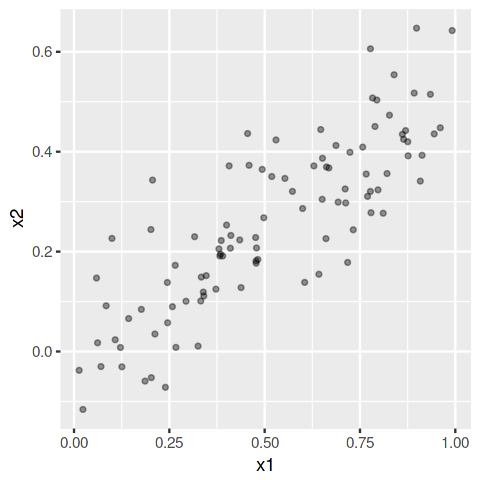

In [118]:
options(repr.plot.width = 4, repr.plot.height = 4)

ggplot(data.frame(x1, x2), aes(x1, x2)) + geom_point(size = 1, alpha = 0.4)

#### Exercise 14c

Using this data, ﬁt a least squares regression to predict **y** using **x1** and **x2**. Describe the results obtained. What are $\hat\beta_0$, $\hat\beta_1$, and $\hat\beta_2$? How do these relate to the true $\beta_0$, $\beta_1$, and $\beta_2$? Can you reject the null hypothesis $H_0 : \beta_1 = 0$? How about the null hypothesis $H_0 : \beta_2 = 0$?

In [119]:
lm.fit <- lm(y ~ x1 + x2)
summary(lm.fit)


Call:
lm(formula = y ~ x1 + x2)

Residuals:
    Min      1Q  Median      3Q     Max 
-2.8311 -0.7273 -0.0537  0.6338  2.3359 

Coefficients:
            Estimate Std. Error t value Pr(>|t|)    
(Intercept)   2.1305     0.2319   9.188 7.61e-15 ***
x1            1.4396     0.7212   1.996   0.0487 *  
x2            1.0097     1.1337   0.891   0.3754    
---
Signif. codes:  0 ‘***’ 0.001 ‘**’ 0.01 ‘*’ 0.05 ‘.’ 0.1 ‘ ’ 1

Residual standard error: 1.056 on 97 degrees of freedom
Multiple R-squared:  0.2088,	Adjusted R-squared:  0.1925 
F-statistic:  12.8 on 2 and 97 DF,  p-value: 1.164e-05


The coefficients are $\hat\beta_0 = 2.13, \hat\beta-1 = 1.44, \hat\beta_2 = 1.01$.
The intercept $\hat\beta_0$ is close to the real $\beta_0$, but the others have a high standard error. The null hypothesis $H_0 : \beta_1 = 0$ has a p-value of 4.9%, which is suggests that null hypothesis might be rejected; however, the null hypothesis $H_0 : \beta_2 = 0$ has a p-value of 37.5%, so it cannot be rejected.

#### Exercise 14d

Now ﬁt a least squares regression to predict **y** using only **x1**. Comment on your results. Can you reject the null hypothesis $H_0 : \beta_1 = 0$?

In [120]:
lm.fit <- lm(y ~ x1)
summary(lm.fit)


Call:
lm(formula = y ~ x1)

Residuals:
     Min       1Q   Median       3Q      Max 
-2.89495 -0.66874 -0.07785  0.59221  2.45560 

Coefficients:
            Estimate Std. Error t value Pr(>|t|)    
(Intercept)   2.1124     0.2307   9.155 8.27e-15 ***
x1            1.9759     0.3963   4.986 2.66e-06 ***
---
Signif. codes:  0 ‘***’ 0.001 ‘**’ 0.01 ‘*’ 0.05 ‘.’ 0.1 ‘ ’ 1

Residual standard error: 1.055 on 98 degrees of freedom
Multiple R-squared:  0.2024,	Adjusted R-squared:  0.1942 
F-statistic: 24.86 on 1 and 98 DF,  p-value: 2.661e-06


The MSE and the adjusted $R²$ remain about the same; the F-statistic, on the other hand, increased from 12.8 to 24.86.  Without **x2**, the null hypothesis $H_0 : \beta_1 = 0$ can be safely rejected.  Furthermore, the standard error of **x1** coefficient decreased a lot from 0.72 to 0.39.

#### Exercise 14e

Now ﬁt a least squares regression to predict **y** using only **x2**. Comment on your results. Can you reject the null hypothesis $H_0 : \beta_1 = 0$?

In [121]:
lm.fit <- lm(y ~ x2)
summary(lm.fit)


Call:
lm(formula = y ~ x2)

Residuals:
     Min       1Q   Median       3Q      Max 
-2.62687 -0.75156 -0.03598  0.72383  2.44890 

Coefficients:
            Estimate Std. Error t value Pr(>|t|)    
(Intercept)   2.3899     0.1949   12.26  < 2e-16 ***
x2            2.8996     0.6330    4.58 1.37e-05 ***
---
Signif. codes:  0 ‘***’ 0.001 ‘**’ 0.01 ‘*’ 0.05 ‘.’ 0.1 ‘ ’ 1

Residual standard error: 1.072 on 98 degrees of freedom
Multiple R-squared:  0.1763,	Adjusted R-squared:  0.1679 
F-statistic: 20.98 on 1 and 98 DF,  p-value: 1.366e-05


The MSE increased slightly from 1.056 to 1.072 and the adjusted $R²$ decreased from 19.2% to 16.8%. The F-statistic, increased from 12.8 to 20.98, but it is lower than **x1**’s 24.86.  Without **x1**, the null hypothesis $H_0 : \beta_1 = 0$ can be safely rejected.

#### Exercise 14f

Do the results obtained in (14c)–(14e) contradict each other? Explain your answer.

They do not contradict. This is due to the collinearity of **x1** and **x2**. When they are both used together, the individual results may be misleading regarding of how each predictor is related to the dependent variable **y**.  One consequence of collinearity is also a high standard error for each predictor coefficient $\hat\beta$ when they are used together.  This standard error is used for the t-statistic; thus, a high standard error lead to a failure when trying to reject a null hypothesis that the coefficient is zero.

#### Exercise 14g

Now suppose we obtain one additional observation, which was unfortunately mismeasured.

In [122]:
x1 <- c(x1, 0.1)
x2 <- c(x2, 0.8)
y <- c(y, 6)

Re-ﬁt the linear models from (c) to (e) using this new data. What eﬀect does this new observation have on the each of the models? In each model, is this observation an outlier? A high-leverage point? Both? Explain your answers.

In [123]:
lm.fit.both <- lm(y ~ x1 + x2)
lm.fit.x1 <- lm(y ~ x1)
lm.fit.x2 <- lm(y ~ x2)
summary(lm.fit.both)
summary(lm.fit.x1)
summary(lm.fit.x2)


Call:
lm(formula = y ~ x1 + x2)

Residuals:
     Min       1Q   Median       3Q      Max 
-2.73348 -0.69318 -0.05263  0.66385  2.30619 

Coefficients:
            Estimate Std. Error t value Pr(>|t|)    
(Intercept)   2.2267     0.2314   9.624 7.91e-16 ***
x1            0.5394     0.5922   0.911  0.36458    
x2            2.5146     0.8977   2.801  0.00614 ** 
---
Signif. codes:  0 ‘***’ 0.001 ‘**’ 0.01 ‘*’ 0.05 ‘.’ 0.1 ‘ ’ 1

Residual standard error: 1.075 on 98 degrees of freedom
Multiple R-squared:  0.2188,	Adjusted R-squared:  0.2029 
F-statistic: 13.72 on 2 and 98 DF,  p-value: 5.564e-06



Call:
lm(formula = y ~ x1)

Residuals:
    Min      1Q  Median      3Q     Max 
-2.8897 -0.6556 -0.0909  0.5682  3.5665 

Coefficients:
            Estimate Std. Error t value Pr(>|t|)    
(Intercept)   2.2569     0.2390   9.445 1.78e-15 ***
x1            1.7657     0.4124   4.282 4.29e-05 ***
---
Signif. codes:  0 ‘***’ 0.001 ‘**’ 0.01 ‘*’ 0.05 ‘.’ 0.1 ‘ ’ 1

Residual standard error: 1.111 on 99 degrees of freedom
Multiple R-squared:  0.1562,	Adjusted R-squared:  0.1477 
F-statistic: 18.33 on 1 and 99 DF,  p-value: 4.295e-05



Call:
lm(formula = y ~ x2)

Residuals:
     Min       1Q   Median       3Q      Max 
-2.64729 -0.71021 -0.06899  0.72699  2.38074 

Coefficients:
            Estimate Std. Error t value Pr(>|t|)    
(Intercept)   2.3451     0.1912  12.264  < 2e-16 ***
x2            3.1190     0.6040   5.164 1.25e-06 ***
---
Signif. codes:  0 ‘***’ 0.001 ‘**’ 0.01 ‘*’ 0.05 ‘.’ 0.1 ‘ ’ 1

Residual standard error: 1.074 on 99 degrees of freedom
Multiple R-squared:  0.2122,	Adjusted R-squared:  0.2042 
F-statistic: 26.66 on 1 and 99 DF,  p-value: 1.253e-06


The MSE in all the three models increased with the new observation. The model with both predictors has **x1**’s t-statistic p-valud shifted to a large value that we cannot reject the respective null hypothesis. The model with **x2** had the best fir so far. Let’s use the diagnostic plots for each one.

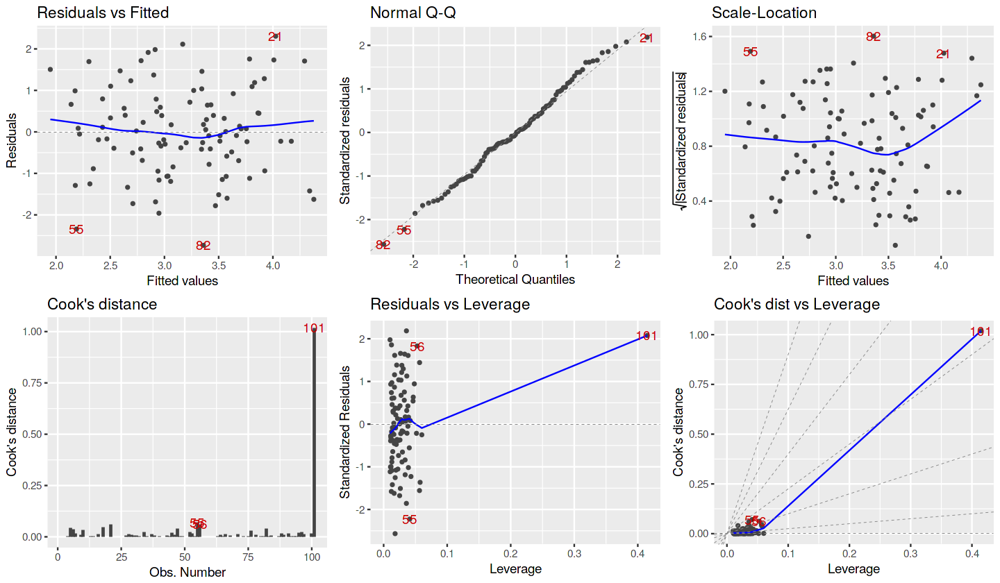

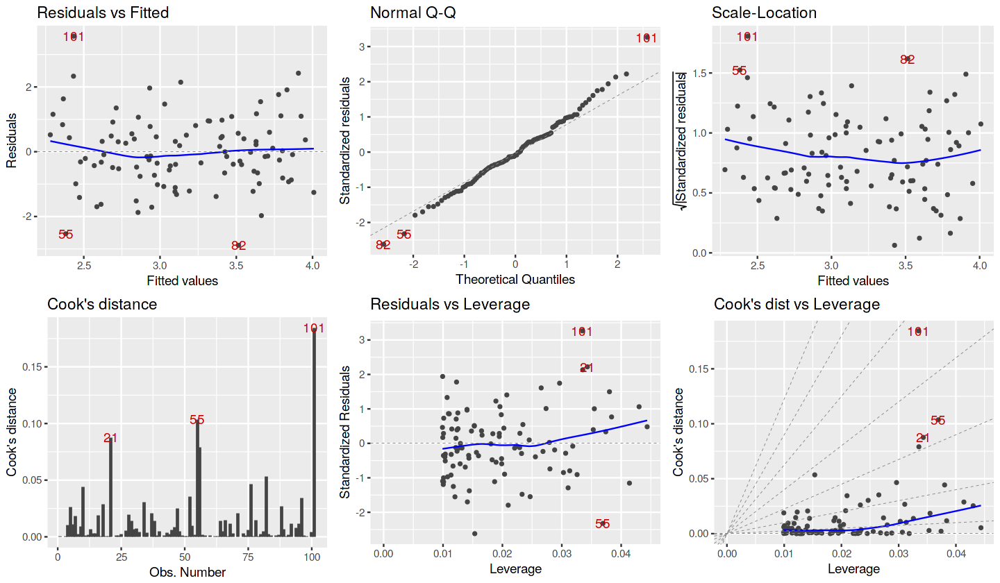

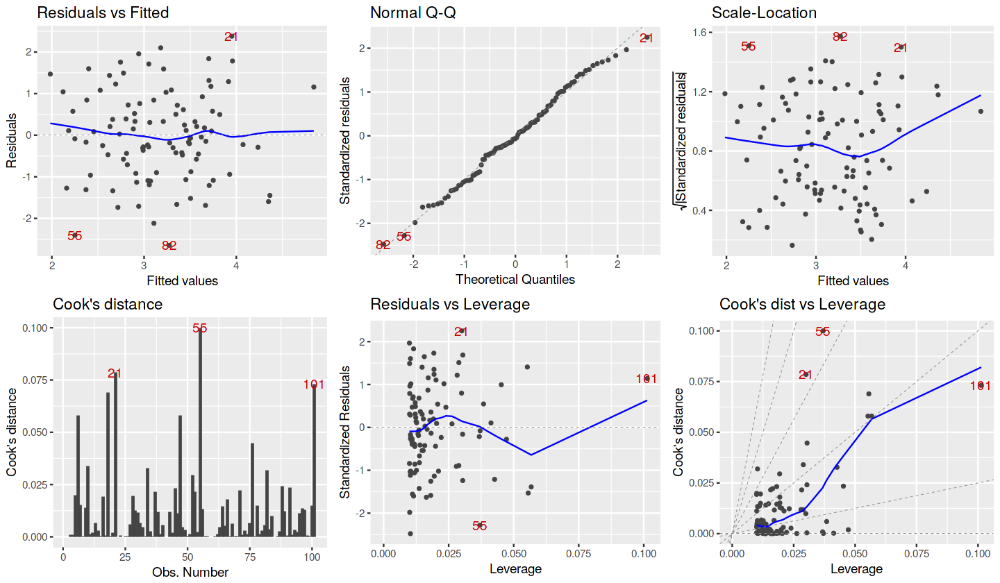

In [124]:
library("ggfortify")

options(repr.plot.width = 12, repr.plot.height = 7)

autoplot(lm.fit.both, which = 1:6, size = 1, label.colour = "#cc0000", ncol = 3)
autoplot(lm.fit.x1, which = 1:6, size = 1, label.colour = "#cc0000", ncol = 3)
autoplot(lm.fit.x2, which = 1:6, size = 1, label.colour = "#cc0000", ncol = 3)

The new observation severely affects the first model, strongly the second, and
significantly the third model.

- In the first model, $y \sim x_1 + x_2$, the observation is **a high-leverage point**
- In the second model, $y \sim x_1$, the observation is **an outlier**
- In the third model, $y \sim x_2$, the observation is **a high-leverage point**

### Exercise 15

This problem involves the **Boston** data set, which we saw in the lab for this chapter. We will now try to predict per capita crime rate using the other variables in this data set. In other words, per capita crime rate is the response, and the other variables are the predictors.

In [125]:
library("MASS")

In [126]:
head(Boston)

crim,zn,indus,chas,nox,rm,age,dis,rad,tax,ptratio,black,lstat,medv
0.00632,18,2.31,0,0.538,6.575,65.2,4.0900,1,296,15.3,396.90,4.98,24.0
0.02731,0,7.07,0,0.469,6.421,78.9,4.9671,2,242,17.8,396.90,9.14,21.6
0.02729,0,7.07,0,0.469,7.185,61.1,4.9671,2,242,17.8,392.83,4.03,34.7
0.03237,0,2.18,0,0.458,6.998,45.8,6.0622,3,222,18.7,394.63,2.94,33.4
0.06905,0,2.18,0,0.458,7.147,54.2,6.0622,3,222,18.7,396.90,5.33,36.2
0.02985,0,2.18,0,0.458,6.430,58.7,6.0622,3,222,18.7,394.12,5.21,28.7


#### Exercise 15a

For each predictor, ﬁt a simple linear regression model to predict the response. Describe your results. In which of the models is there a statistically signiﬁcant association between the predictor and the response? Create some plots to back up your assertions.

In [127]:
fit.model <- function(predictor) {
    model <- lm(as.formula(paste("crim ~", predictor)), data = Boston)
    print(round(summary(model)$coefficients, digits = 4))
    f <- summary(model)$fstatistic
    p <- pf(f[1], f[2], f[3], lower.tail = FALSE)
    print(p)
    # print(autoplot(model, which = 1:6, size = 1, label.colour = '#cc0000', 
    # ncol = 3, title = predictor))
}

for (pred in setdiff(names(Boston), "crim")) fit.model(pred)

            Estimate Std. Error t value Pr(>|t|)
(Intercept)   4.4537     0.4172 10.6747        0
zn           -0.0739     0.0161 -4.5938        0
       value 
5.506472e-06 
            Estimate Std. Error t value Pr(>|t|)
(Intercept)  -2.0637     0.6672 -3.0930   0.0021
indus         0.5098     0.0510  9.9908   0.0000
       value 
1.450349e-21 
            Estimate Std. Error t value Pr(>|t|)
(Intercept)   3.7444     0.3961  9.4530   0.0000
chas         -1.8928     1.5061 -1.2567   0.2094
    value 
0.2094345 
            Estimate Std. Error t value Pr(>|t|)
(Intercept) -13.7199     1.6995  -8.073        0
nox          31.2485     2.9992  10.419        0
       value 
3.751739e-23 
            Estimate Std. Error t value Pr(>|t|)
(Intercept)  20.4818     3.3645  6.0877        0
rm           -2.6841     0.5320 -5.0448        0
       value 
6.346703e-07 
            Estimate Std. Error t value Pr(>|t|)
(Intercept)  -3.7779     0.9440 -4.0021    1e-04
age           0.1078     0.0127  

Separately, we can reject the null hypothesis of $H_0 : \beta = 0$ for all predictors except **chas** .

#### Exercise 15b

Fit a multiple regression model to predict the response using all of the predictors. Describe your results. For which predictors can we reject the null hypothesis $H_0 : \beta_j = 0$?

In [128]:
lm.fit <- lm(crim ~ ., data = Boston)
summary(lm.fit)


Call:
lm(formula = crim ~ ., data = Boston)

Residuals:
   Min     1Q Median     3Q    Max 
-9.924 -2.120 -0.353  1.019 75.051 

Coefficients:
              Estimate Std. Error t value Pr(>|t|)    
(Intercept)  17.033228   7.234903   2.354 0.018949 *  
zn            0.044855   0.018734   2.394 0.017025 *  
indus        -0.063855   0.083407  -0.766 0.444294    
chas         -0.749134   1.180147  -0.635 0.525867    
nox         -10.313535   5.275536  -1.955 0.051152 .  
rm            0.430131   0.612830   0.702 0.483089    
age           0.001452   0.017925   0.081 0.935488    
dis          -0.987176   0.281817  -3.503 0.000502 ***
rad           0.588209   0.088049   6.680 6.46e-11 ***
tax          -0.003780   0.005156  -0.733 0.463793    
ptratio      -0.271081   0.186450  -1.454 0.146611    
black        -0.007538   0.003673  -2.052 0.040702 *  
lstat         0.126211   0.075725   1.667 0.096208 .  
medv         -0.198887   0.060516  -3.287 0.001087 ** 
---
Signif. codes:  0 ‘***’ 0.0

We can reject the null hypothesis for **zn**, **dis**, **rad**, **black**, and **medv**.

#### Exercise 15c

How do your results from (a) compare to your results from (b)? Create a plot displaying the univariate regression coeﬃcients from (a) on the x-axis, and the multiple regression coeﬃcients from (b) on the y-axis. That is, each predictor is displayed as a single point in the plot. Its coeﬃcient in a simple linear regression model is shown on the x-axis, and its coeﬃcient estimate in the multiple linear regression model is shown on the y-axis.

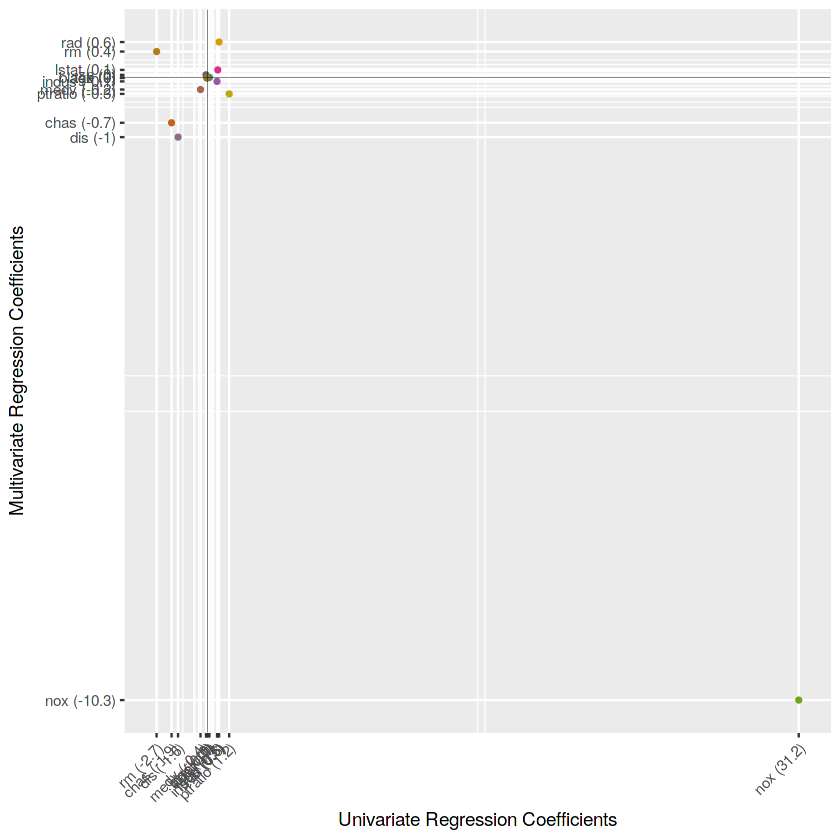

In [129]:
library("foreach")

options(repr.plot.width = 7, repr.plot.height = 7)

fit.model <- function(predictor) {
    model <- lm(as.formula(paste("crim ~", predictor)), data = Boston)
    summary(model)$coefficients[2]
}

predictors <- setdiff(names(Boston), "crim")

x.coefficients <- foreach(pred = predictors, .combine = 'c') %do%
    fit.model(pred)

lm.fit <- lm(crim ~ ., data = Boston)
y.coefficients <- summary(lm.fit)$coefficients[-1, 1]

coefficients <- as.data.frame(cbind(
    x = x.coefficients, 
    y = y.coefficients,
    predictor = factor(predictors)))

format.label.coef <- function(predictor, coef) {
    paste0(predictor, " (", round(coef, digits = 1), ")")
}

ggplot(coefficients, aes(x, y, colour = factor(predictor))) + 
    geom_point(size = 1) +
    scale_x_continuous(limits = c(min(x.coefficients), max(x.coefficients)),
                       breaks = x.coefficients,
                       labels = format.label.coef(predictors, x.coefficients)) +
    scale_y_continuous(limits = c(min(y.coefficients), max(y.coefficients)),
                       breaks = y.coefficients,
                       labels = format.label.coef(predictors, y.coefficients)) +
    geom_vline(xintercept = 0, size = 0.1) +
    geom_hline(yintercept = 0, size = 0.1) +
    scale_colour_manual(values = colorRampPalette(brewer.pal(8, "Dark2"))(13)) +
    xlab("Univariate Regression Coefficients") +
    ylab("Multivariate Regression Coefficients") +
    theme(axis.text.x = element_text(angle = 45, hjust = 1)) +
    guides(colour = FALSE)

Particularly, **nox** has a coefficient 31.2 on $y \sim NO_x$, but its coefficient
on the multivariate model is -10.3.

This and the other differences are because of differences that affect how we 
interpret the univariate and multivariate models.  In univariate, the slope, 
$\beta_1$ is interpreted as how much a change in the predictor affects the 
dependent variable.  In the multivariate cases, this interpretation is done
by holding fixed all the other predictors.  Moreover, when we have collinearity,
only one of the predictors may be used, while the other can be near zero.

Let’s see the correlation matrix:

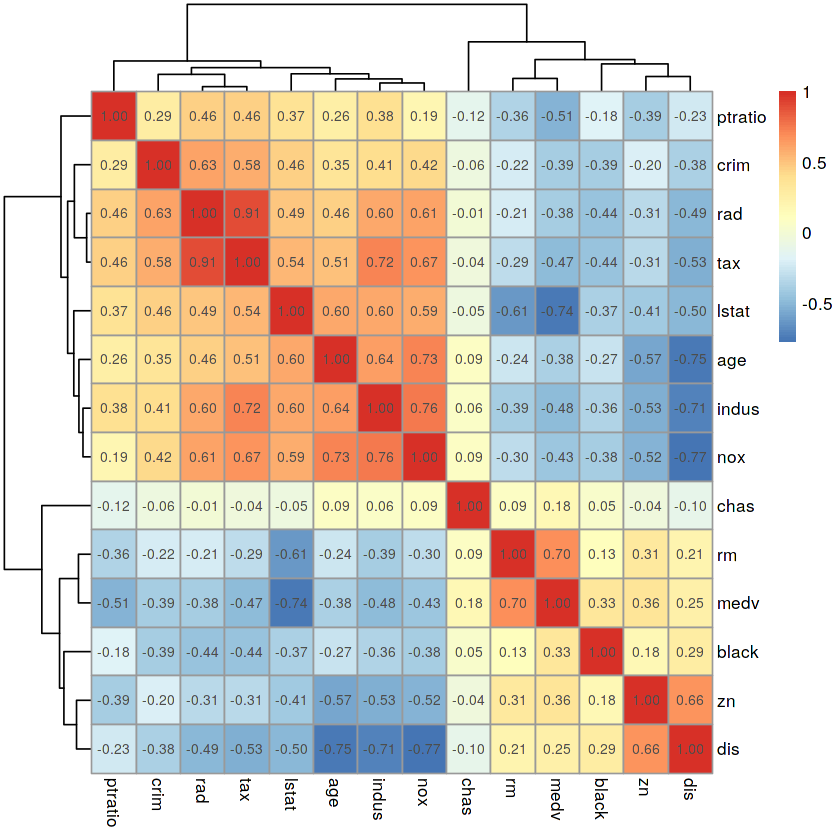

In [130]:
pheatmap(cor(Boston), display_numbers = TRUE)

For instance, we know **nox** coefficient in the univariate model is 31.2. If we add **nox** and its three positively correlated
predictors, **tax**, **rad**, and **data**, we get these coefficients:

In [131]:
coef(lm(crim ~ nox + age + tax + rad, data = Boston))

(Intercept)          nox          age          tax          rad 
-3.931156626 -0.457051111  0.025800886  0.001899802  0.550122249

#### Exercise 15d

Is there evidence of non-linear association between any of the predictors and the response? To answer this question, for each predictor $X$, ﬁt a model of the form
$$
    y = \beta_0 + \beta_1 X + \beta_2 X^2 + \beta_3 X^3 + \epsilon.
$$

In [132]:
fit.model <- function(predictor) {
    formula <- paste0("crim ~ poly(", predictor, ", 3)")
    model <- lm(as.formula(formula), data = Boston)
    print(formula)
    print(summary(model))
}

predictors <- setdiff(names(Boston), c("crim", "chas"))

for (predictor in predictors) fit.model(predictor)

[1] "crim ~ poly(zn, 3)"

Call:
lm(formula = as.formula(formula), data = Boston)

Residuals:
   Min     1Q Median     3Q    Max 
-4.821 -4.614 -1.294  0.473 84.130 

Coefficients:
             Estimate Std. Error t value Pr(>|t|)    
(Intercept)    3.6135     0.3722   9.709  < 2e-16 ***
poly(zn, 3)1 -38.7498     8.3722  -4.628  4.7e-06 ***
poly(zn, 3)2  23.9398     8.3722   2.859  0.00442 ** 
poly(zn, 3)3 -10.0719     8.3722  -1.203  0.22954    
---
Signif. codes:  0 ‘***’ 0.001 ‘**’ 0.01 ‘*’ 0.05 ‘.’ 0.1 ‘ ’ 1

Residual standard error: 8.372 on 502 degrees of freedom
Multiple R-squared:  0.05824,	Adjusted R-squared:  0.05261 
F-statistic: 10.35 on 3 and 502 DF,  p-value: 1.281e-06

[1] "crim ~ poly(indus, 3)"

Call:
lm(formula = as.formula(formula), data = Boston)

Residuals:
   Min     1Q Median     3Q    Max 
-8.278 -2.514  0.054  0.764 79.713 

Coefficients:
                Estimate Std. Error t value Pr(>|t|)    
(Intercept)        3.614      0.330  10.950  < 2e-16 ***
poly(indus,

##### Degree 2

In [133]:
deg2 <- setdiff(names(Boston), c("crim", "chas", "black"))
deg2

[1] "zn"      "indus"   "nox"     "rm"      "age"     "dis"     "rad"     "tax"     "ptratio" "lstat"   "medv"

##### Degree 3

In [134]:
deg3 <- setdiff(names(Boston), c("crim", "chas", "zn", "rm", "rad", "tax", 
                                 "black", "lstat"))
deg3

[1] "indus"   "nox"     "age"     "dis"     "ptratio" "medv"

Let’s fit the model with all these predictors.

In [135]:
formula <- "crim ~ . - chas"

for (predictor in setdiff(deg2, deg3)) 
    formula <- paste0(formula, " + poly(", predictor, ", 2)")

for (predictor in deg3) 
    formula <- paste0(formula, " + poly(", predictor, ", 3)")

cat("Model:", formula, "\n")
model <- lm(as.formula(formula), data = Boston)
summary(model)

Model: crim ~ . - chas + poly(zn, 2) + poly(rm, 2) + poly(rad, 2) + poly(tax, 2) + poly(lstat, 2) + poly(indus, 3) + poly(nox, 3) + poly(age, 3) + poly(dis, 3) + poly(ptratio, 3) + poly(medv, 3) 



Call:
lm(formula = as.formula(formula), data = Boston)

Residuals:
    Min      1Q  Median      3Q     Max 
-15.285  -1.586  -0.126   1.048  68.323 

Coefficients: (11 not defined because of singularities)
                    Estimate Std. Error t value Pr(>|t|)    
(Intercept)        36.913347   7.876818   4.686 3.64e-06 ***
zn                 -0.001412   0.022594  -0.062 0.950194    
indus               0.025422   0.084228   0.302 0.762918    
nox               -20.350572   6.753852  -3.013 0.002723 ** 
rm                 -0.079071   0.618652  -0.128 0.898351    
age                -0.004994   0.018519  -0.270 0.787510    
dis                -1.046078   0.311480  -3.358 0.000847 ***
rad                 0.589170   0.197489   2.983 0.002998 ** 
tax                -0.011417   0.008516  -1.341 0.180667    
ptratio            -0.310479   0.184435  -1.683 0.092952 .  
black              -0.003507   0.003338  -1.051 0.293955    
lstat              -0.224181   0.079586  -2.817 0.005051 ** 


In [136]:
model <- lm(crim ~ . - chas + poly(dis, 3) + poly(medv, 3), data = Boston)
summary(model)


Call:
lm(formula = crim ~ . - chas + poly(dis, 3) + poly(medv, 3), 
    data = Boston)

Residuals:
    Min      1Q  Median      3Q     Max 
-16.271  -1.887  -0.177   1.187  68.726 

Coefficients: (2 not defined because of singularities)
                 Estimate Std. Error t value Pr(>|t|)    
(Intercept)     40.301009   7.032218   5.731 1.75e-08 ***
zn              -0.010382   0.017650  -0.588 0.556652    
indus           -0.023929   0.075384  -0.317 0.751058    
nox            -20.484963   4.985064  -4.109 4.65e-05 ***
rm              -0.558906   0.577351  -0.968 0.333497    
age             -0.005581   0.016604  -0.336 0.736932    
dis             -1.227785   0.285519  -4.300 2.06e-05 ***
rad              0.601716   0.078507   7.665 9.74e-14 ***
tax             -0.011829   0.004641  -2.548 0.011124 *  
ptratio         -0.277380   0.170360  -1.628 0.104126    
black           -0.003726   0.003287  -1.134 0.257516    
lstat           -0.213164   0.074349  -2.867 0.004322 ** 
medv    

# Chapter 4. Classification

## Lab: Logistic Regression, LDA, QDA, and KNN

### The Stock Market Data

We will begin by examining some numerical and graphical summaries of the **Smarket** data, which is part of the `ISLR` library. This data set consists of percentage returns for the S&P 500 stock index over 1,250 days, from the beginning of 2001 until the end of 2005. For each date, we have recorded the percentage returns for each of the ﬁve previous trading days, **Lag1** through **Lag5**. We have also recorded **Volume** (the number of shares traded on the previous day, in billions), **Today** (the percentage return on the date in question) and **Direction** (whether the market was *Up* or *Down* on this date).

In [137]:
library("ISLR")

head(Smarket)

Year,Lag1,Lag2,Lag3,Lag4,Lag5,Volume,Today,Direction
2001,0.381,-0.192,-2.624,-1.055,5.010,1.1913,0.959,Up
2001,0.959,0.381,-0.192,-2.624,-1.055,1.2965,1.032,Up
2001,1.032,0.959,0.381,-0.192,-2.624,1.4112,-0.623,Down
2001,-0.623,1.032,0.959,0.381,-0.192,1.2760,0.614,Up
2001,0.614,-0.623,1.032,0.959,0.381,1.2057,0.213,Up
2001,0.213,0.614,-0.623,1.032,0.959,1.3491,1.392,Up


Observe how the percentage rolls the diagonals. It looks the rows are ordered
by the day of the year.

In [138]:
dim(Smarket)

[1] 1250    9

In [139]:
summary(Smarket[, c("Year", "Volume", "Direction")])

      Year          Volume       Direction 
 Min.   :2001   Min.   :0.3561   Down:602  
 1st Qu.:2002   1st Qu.:1.2574   Up  :648  
 Median :2003   Median :1.4229             
 Mean   :2003   Mean   :1.4783             
 3rd Qu.:2004   3rd Qu.:1.6417             
 Max.   :2005   Max.   :3.1525             

In [140]:
summary(Smarket[, c("Today", paste0("Lag", 1:5))])

     Today                Lag1                Lag2                Lag3                Lag4                Lag5         
 Min.   :-4.922000   Min.   :-4.922000   Min.   :-4.922000   Min.   :-4.922000   Min.   :-4.922000   Min.   :-4.92200  
 1st Qu.:-0.639500   1st Qu.:-0.639500   1st Qu.:-0.639500   1st Qu.:-0.640000   1st Qu.:-0.640000   1st Qu.:-0.64000  
 Median : 0.038500   Median : 0.039000   Median : 0.039000   Median : 0.038500   Median : 0.038500   Median : 0.03850  
 Mean   : 0.003138   Mean   : 0.003834   Mean   : 0.003919   Mean   : 0.001716   Mean   : 0.001636   Mean   : 0.00561  
 3rd Qu.: 0.596750   3rd Qu.: 0.596750   3rd Qu.: 0.596750   3rd Qu.: 0.596750   3rd Qu.: 0.596750   3rd Qu.: 0.59700  
 Max.   : 5.733000   Max.   : 5.733000   Max.   : 5.733000   Max.   : 5.733000   Max.   : 5.733000   Max.   : 5.73300  

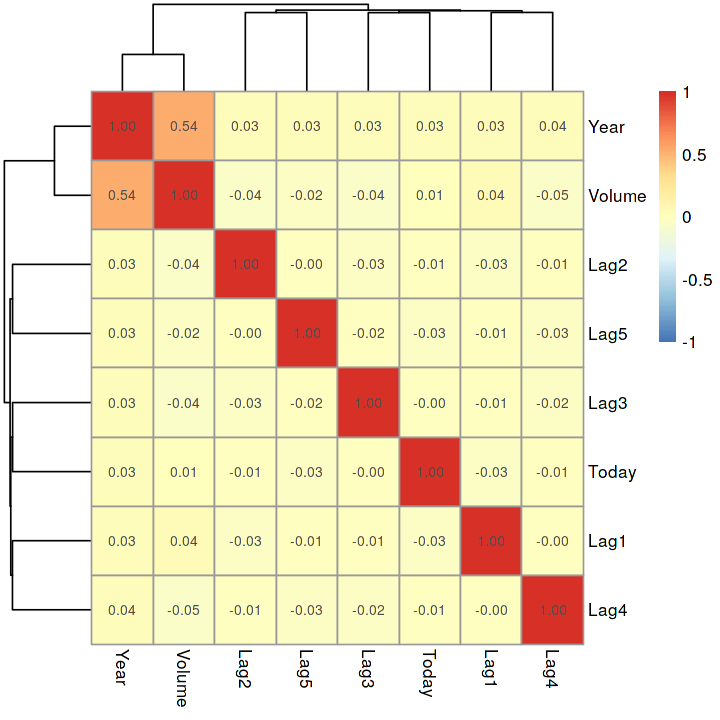

In [141]:
options(repr.plot.width = 6, repr.plot.height = 6)

pheatmap(cor(Smarket[, setdiff(names(Smarket), "Direction")]),
         display_numbers = TRUE,
         breaks = seq(-1, 1, 0.02))

The only predictors that present some correlation are **Year** and **Volume**.
Not even **Today** with **Lag1** (Yesterday) have significant correlation.
As we know the data is ordered, we can plot the volume over time:

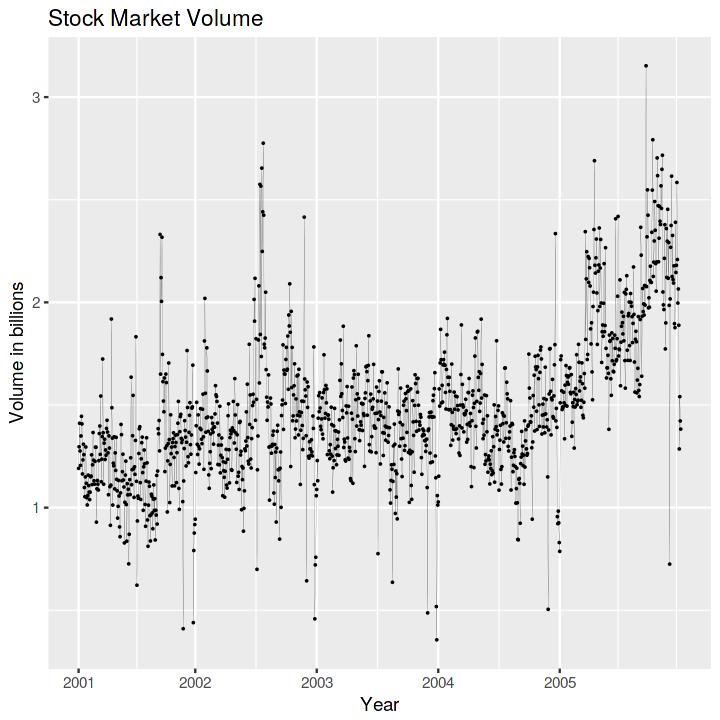

In [142]:
n <- nrow(Smarket)

row.of.the.first.day.of.year <- Smarket %>% 
    group_by(Year) %>% 
    summarise(days = n()) %>% 
    mutate(first.day = cumsum(days) - days + 1)

by.year <- cbind(Day = 1:n, Smarket)
ggplot(by.year, aes(Day, Volume)) + 
    geom_point(size = 0) + 
    geom_line(size = 0.03) +
    scale_x_continuous(
        limits = c(1, n),
        breaks = row.of.the.first.day.of.year$first.day,
        labels = Smarket$Year[row.of.the.first.day.of.year$first.day]) +
    xlab("Year") +
    ylab("Volume in billions") +
    ggtitle("Stock Market Volume")

In [143]:
Smarket %>% group_by(Year) %>% summarise(AverageVolume = mean(Volume))

Year,AverageVolume
2001,1.226950
2002,1.428451
2003,1.384693
2004,1.424159
2005,1.917298


The average number of shares traded daily increased from 2001 to 2005 by
$1.92 - 1.23 = 0.69$ billions.

### Logistic Regression

In [144]:
glm.fits <- glm(Direction ~ Lag1 + Lag2 + Lag3 + Lag4 + Lag5 + Volume, 
                data = Smarket, family = binomial)
summary(glm.fits)


Call:
glm(formula = Direction ~ Lag1 + Lag2 + Lag3 + Lag4 + Lag5 + 
    Volume, family = binomial, data = Smarket)

Deviance Residuals: 
   Min      1Q  Median      3Q     Max  
-1.446  -1.203   1.065   1.145   1.326  

Coefficients:
             Estimate Std. Error z value Pr(>|z|)
(Intercept) -0.126000   0.240736  -0.523    0.601
Lag1        -0.073074   0.050167  -1.457    0.145
Lag2        -0.042301   0.050086  -0.845    0.398
Lag3         0.011085   0.049939   0.222    0.824
Lag4         0.009359   0.049974   0.187    0.851
Lag5         0.010313   0.049511   0.208    0.835
Volume       0.135441   0.158360   0.855    0.392

(Dispersion parameter for binomial family taken to be 1)

    Null deviance: 1731.2  on 1249  degrees of freedom
Residual deviance: 1727.6  on 1243  degrees of freedom
AIC: 1741.6

Number of Fisher Scoring iterations: 3


The smallest p-value here is associated with **Lag1**.  The coefficient says the if the market has a positive return yesterday, then the return today will more likely be negative. However, since the p-value for **Lag1**’s coefficient is 14.5%, we cannot reject the null hypothesis $H_0 : \beta_1 = 0$. In fact, the p-value for all the predictors is high, so there is no clear evidence of a real association between **Lag1** and **Direction** nor to any other with **Direction**.

In [145]:
coef(glm.fits)

(Intercept)         Lag1         Lag2         Lag3         Lag4         Lag5       Volume 
-0.126000257 -0.073073746 -0.042301344  0.011085108  0.009358938  0.010313068  0.135440659

In [146]:
summary(glm.fits)$coef[, 4]

(Intercept)        Lag1        Lag2        Lag3        Lag4        Lag5      Volume 
  0.6006983   0.1452272   0.3983491   0.8243333   0.8514445   0.8349974   0.3924004

The `predict(type = "response")` output probabilities. When no data parameter
is specified, the output refers to the training data.

In [147]:
glm.probs <- predict(glm.fits, type = "response")
glm.probs[1:10]

1         2         3         4         5         6         7         8         9        10 
0.5070841 0.4814679 0.4811388 0.5152224 0.5107812 0.5069565 0.4926509 0.5092292 0.5176135 0.4888378

Let us see how the target variable has been encoded:

In [148]:
contrasts(Smarket$Direction)

,Up
Down,0
Up,1


Hence, the outputs of the logistic regression model refers to the probability
of a given day’s direction being *Up*.

In [149]:
glm.pred <- rep("Down", nrow(Smarket))
glm.pred[glm.probs > 0.5] <- "Up"

In [150]:
library("caret")

confusionMatrix(glm.pred, Smarket$Direction, positive = "Up")

Loading required package: lattice


Confusion Matrix and Statistics

          Reference
Prediction Down  Up
      Down  145 141
      Up    457 507
                                          
               Accuracy : 0.5216          
                 95% CI : (0.4935, 0.5496)
    No Information Rate : 0.5184          
    P-Value [Acc > NIR] : 0.4216          
                                          
                  Kappa : 0.0237          
 Mcnemar's Test P-Value : <2e-16          
                                          
            Sensitivity : 0.7824          
            Specificity : 0.2409          
         Pos Pred Value : 0.5259          
         Neg Pred Value : 0.5070          
             Prevalence : 0.5184          
         Detection Rate : 0.4056          
   Detection Prevalence : 0.7712          
      Balanced Accuracy : 0.5116          
                                          
       'Positive' Class : Up              
                                          

The accuracy is the same as

In [151]:
mean(glm.pred == Smarket$Direction)

[1] 0.5216

The diagonal elements are the True Negatives and True Positives.
Note that this assessment is on the same data we trained our model. We should
split it up.

In [152]:
train <- Smarket$Year < 2005
Smarket.2005 <- Smarket[!train, ]
dim(Smarket.2005)
Direction.2005 <- Smarket$Direction[!train]

[1] 252   9

In [153]:
glm.fits <- glm(Direction ~ Lag1 + Lag2 + Lag3 + Lag4 + Lag5 + Volume, 
                data = Smarket, family = binomial, subset = train)
glm.probs <- predict(glm.fits, Smarket.2005, type = "response")

Now we train the logistic regression model with the `train` subset and test it 
on the `!train` subset.

In [154]:
glm.pred <- rep("Down", sum(!train))
glm.pred[glm.probs > 0.5] <- "Up"
confusionMatrix(glm.pred, Direction.2005, positive = "Up")

Confusion Matrix and Statistics

          Reference
Prediction Down Up
      Down   77 97
      Up     34 44
                                         
               Accuracy : 0.4802         
                 95% CI : (0.417, 0.5437)
    No Information Rate : 0.5595         
    P-Value [Acc > NIR] : 0.9952         
                                         
                  Kappa : 0.0054         
 Mcnemar's Test P-Value : 6.062e-08      
                                         
            Sensitivity : 0.3121         
            Specificity : 0.6937         
         Pos Pred Value : 0.5641         
         Neg Pred Value : 0.4425         
             Prevalence : 0.5595         
         Detection Rate : 0.1746         
   Detection Prevalence : 0.3095         
      Balanced Accuracy : 0.5029         
                                         
       'Positive' Class : Up             
                                         

In [155]:
mean(glm.pred == Direction.2005)
mean(glm.pred != Direction.2005)

[1] 0.4801587

[1] 0.5198413

Our model is worse than the random guessing.

In [156]:
glm.fits <- glm(Direction ~ Lag1 + Lag2, data = Smarket, family = binomial, 
                subset = train)
summary(glm.fits)


Call:
glm(formula = Direction ~ Lag1 + Lag2, family = binomial, data = Smarket, 
    subset = train)

Deviance Residuals: 
   Min      1Q  Median      3Q     Max  
-1.345  -1.188   1.074   1.164   1.326  

Coefficients:
            Estimate Std. Error z value Pr(>|z|)
(Intercept)  0.03222    0.06338   0.508    0.611
Lag1        -0.05562    0.05171  -1.076    0.282
Lag2        -0.04449    0.05166  -0.861    0.389

(Dispersion parameter for binomial family taken to be 1)

    Null deviance: 1383.3  on 997  degrees of freedom
Residual deviance: 1381.4  on 995  degrees of freedom
AIC: 1387.4

Number of Fisher Scoring iterations: 3


In [157]:
glm.probs <- predict(glm.fits, Smarket.2005, type = "response")
glm.pred <- rep("Down", sum(!train))
glm.pred[glm.probs > 0.5] <- "Up"
confusionMatrix(glm.pred, Direction.2005, positive = "Up")

Confusion Matrix and Statistics

          Reference
Prediction Down  Up
      Down   35  35
      Up     76 106
                                          
               Accuracy : 0.5595          
                 95% CI : (0.4959, 0.6218)
    No Information Rate : 0.5595          
    P-Value [Acc > NIR] : 0.5262856       
                                          
                  Kappa : 0.0698          
 Mcnemar's Test P-Value : 0.0001467       
                                          
            Sensitivity : 0.7518          
            Specificity : 0.3153          
         Pos Pred Value : 0.5824          
         Neg Pred Value : 0.5000          
             Prevalence : 0.5595          
         Detection Rate : 0.4206          
   Detection Prevalence : 0.7222          
      Balanced Accuracy : 0.5335          
                                          
       'Positive' Class : Up              
                                          

With an accuracy of 56% we are now as good as predicting that the market will
increase every day; hence, this model is as good as a naïve approach.

In [158]:
106 / (76 + 106)
precision(factor(glm.pred), Direction.2005, relevant = "Up")

[1] 0.5824176

[1] 0.5824176

On days that the logistic regression says the market will go up, it has a 
58% accuracy rate. “This suggests a possible trading strategy of buying on days 
when the model predicts an in- creasing market, and avoiding trades on days 
when a decrease is predicted. Of course one would need to investigate more 
carefully whether this small improvement was real or just due to random chance.”

To predict new points:

In [159]:
new.data <- data.frame(Lag1 = c(1.2, 1.5), 
                       Lag2 = c(1.1, -0.8))
predict(glm.fits, newdata = new.data, type = "response")

1         2 
0.4791462 0.4960939

### Linear Discriminant Analysis

Now we will perform LDA on the **Smarket** data. In `R`, we ﬁt an LDA model using the `lda()` function, which is part of the `MASS` library. Notice that the `lda()` syntax for the `lda()` function is identical to that of `lm()`, and to that of `glm()` except for the absence of the family option. We ﬁt the model using only the observations before 2005.

In [160]:
library("MASS")
lda.fit <- lda(Direction ~ Lag1 + Lag2, data = Smarket, subset = train)
lda.fit

Call:
lda(Direction ~ Lag1 + Lag2, data = Smarket, subset = train)

Prior probabilities of groups:
    Down       Up 
0.491984 0.508016 

Group means:
            Lag1        Lag2
Down  0.04279022  0.03389409
Up   -0.03954635 -0.03132544

Coefficients of linear discriminants:
            LD1
Lag1 -0.6420190
Lag2 -0.5135293

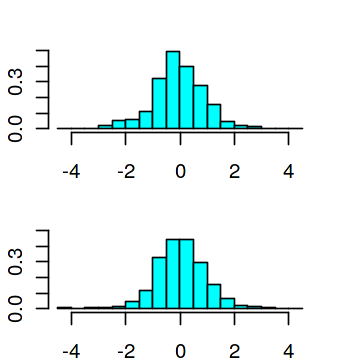

In [161]:
options(repr.plot.width = 3, repr.plot.height = 3)

par(mar = rep(2, 4))
plot(lda.fit)